## Summary

1. Data loading

2. Data cleaning

    [2.1 Missing values](#21-nulls)

    [2.2 Duplicated rows](#22-duplicated-rows)

    [2.3 Outliers](#23-outliers)

    [2.4 Exploring columns](#24-exploring-columns)

    2.4.1 Claims

    2.4.2 Other columns

3. Feature engineering

    [3.1 Specialization, grouping and classification](#31-specialization-groupings-and-classification)

    [3.2 Working hours](#32-working-hours)

    [3.3 Ownership](#33-ownership)

    [3.4 Languages spoken](#34-languages-spoken)

    [3.5 Providers per county](#35-providers-per-county)

    [3.6 Date feature ](#36-date-feature)

    [3.7 Lagged variables](#37-lagged-variables)

    [3.8 Dropping features](#38-dropping-features)

4. Encoding

5. Prepare for modelling

    5.1 Checks of prepared data
    
    5.2 Splitting dataset

    5.3 Scaling

    5.4 Balancing

6. Modelling

#### 1. Data loading <a id='loading'></a>

In [1]:
#!pip3 install ydata_profiling

In [2]:
#!pip3 install optuna

In [3]:
import pandas as pd
pd.set_option('display.max_columns', 1000)

import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
import plotly.graph_objects as go
import plotly.express as px

from ydata_profiling import ProfileReport

from sklearn.ensemble import RandomForestRegressor
from sklearn.base import BaseEstimator, TransformerMixin
from sklearn.preprocessing import OneHotEncoder
from sklearn.model_selection import cross_val_predict, KFold
from sklearn.metrics import mean_absolute_error, mean_squared_error
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor
from xgboost import XGBRegressor

import pickle
from joblib import dump, load
import itertools
import optuna
import ast

bold = "\033[1m"
reset = "\033[0m"

In [4]:
accenture_colors = ['#A100FF', '#000000']

Loading the data

In [5]:
data = pd.read_excel('datos_ie.xlsx')
data.head()

,npi,countyID,census_tract,zip5,service_year,service_quarter,standard_services_claims,tele_services_claims,total_claims,standard_services_patients,tele_services_patients,total_patients,standard_services_claims_year,tele_services_claims_year,total_claims_year,standard_services_patients_year,tele_services_patients_year,total_patients_year,standard_services_psychotherapy_claims,tele_services_psychotherapy_claims,total_psychotherapy_claims,standard_services_psychotherapy_patients,tele_services_psychotherapy_patients,total_psychotherapy_patients,standard_services_psychotherapy_claims_year,tele_services_psychotherapy_claims_year,total_psychotherapy_claims_year,standard_services_psychotherapy_patients_year,tele_services_psychotherapy_patients_year,total_psychotherapy_patients_year,NPI_Deactivation_Reason_Code,NPI_Deactivation_Date,NPI_Reactivation_Date,Healthcare_Provider_Taxonomy_Code_1,Grouping_1,Classification_1,Specialization_1,Display_Name_1,%psychotherapy_claims,%teleService_claims,%tele_psychotherapy_claims,%psychotherapy_patients,%stdService_patients,%teleService_patients,%tele_psychotherapy_patients,%psychotherapy_claims_year,%teleService_claims_year,%tele_psychotherapy_claims_year,%psychotherapy_patients_year,%stdService_patients_year,%teleService_patients_year,%tele_psychotherapy_patients_year,psychotherapy_provider_through_taxonomy,provided_psychotherapy,psychotherapy_provider,countyname,urbanity,lat,long,transport_access,broadband_access,total_medicaid_claims,total_medicaid_patients,provider_size,Entity_Type_Code,AH_Sign language services for the deaf and hard of hearing,EN_English,SP_Spanish,NX_American Indian or Alaska Native languages,FX_Other languages (excluding Spanish),F4_Arabic,F17_Any Chinese Language,F19_Creole,F25_Farsi,F28_French,F30_German,F31_Greek,F35_Hebrew,F36_Hindi,F37_Hmong,F42_Italian,F43_Japanese,F47_Korean,F66_Polish,F67_Portuguese,F70_Russian,F81_Tagalog,F92_Vietnamese,N24_Ojibwa,N40_Yupik,Spoken_Language_Accessibility,black_owned,latino_owned,lgbtq+_owned,veteran_owned,women_owned,owner_identification,planning_accepts_new_patients,business_status,working_hours_cleaned,Weekend Availability,Availability Before 8AM,Availability After 5PM,total_commercial_claims,total_commercial_patients,total_medicare_claims,total_medicare_patients,total_other_payers_claims,total_other_payers_patients,total_commercial_claims_year,total_commercial_patients_year,total_medicaid_claims_year,total_medicaid_patients_year,total_medicare_claims_year,total_medicare_patients_year,total_other_payers_claims_year,total_other_payers_patients_year
0,1,51,16.04,28348,2020,2,0,0,0,0,0,0,0,8,8,0,5,5,0,0,0,0,0,0,0,8,8,0,5,5,NaN,NaT,NaT,101YA0400X,Behavioral Health & Social Service Providers,Counselor,Addiction (Substance Use Disorder),Addiction (Substance Use Disorder) Counselor,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.000000,1.000000,1.0,0.000000,1.000000,1.000000,1,1,1,Cumberland,Urban,34.985025,-78.916585,0.9,0.89,0,0,Small,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,Info Not Available,0,Info Not Available,Info Not Available,Info Not Available,Info Not Available,Info Not Available,0,0,0,0,8,2,0,0,0,0,0,0,16,4
1,1,51,16.04,28348,2020,1,0,0,0,0,0,0,0,8,8,0,5,5,0,0,0,0,0,0,0,8,8,0,5,5,NaN,NaT,NaT,101YA0400X,Behavioral Health & Social Service Providers,Counselor,Addiction (Substance Use Disorder),Addiction (Substance Use Disorder) Counselor,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.000000,1.000000,1.0,0.000000,1.000000,1.000000,1,1,1,Cumberland,Urban,34.985025,-78.916585,0.9,0.89,0,0,Small,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,Info Not Available,0,Info Not Available,Info Not Available,Info Not Available,Info Not Available,Info Not Available,0,0,0,0,0,0,0,0,0,0,0,0,0,0
2,1,51,16.04,28348,2020,3,0,2,2,0,2,2,0,8,8,0,5,5,0,2,2,0,2,2,0,8,8,0,5,5,NaN,NaT,NaT,101YA0400X,Behavioral Health & Social Service Providers,Counselor,Addiction (Substance Use Disorder),Addiction (Substance Use Disorder) Counselor,1.0,1.0,1.

Loading the dict with specialization mapping

In [6]:
# Read the content of the file
file_path = "specialization_dict.txt"

with open(file_path, "r") as file:
    dict_content = file.read()

In [7]:
specialization_dict = ast.literal_eval(dict_content)

#### 2. Data cleaning

In [8]:
# Overview of the Data
print(f"Shape of the DataFrame: {data.shape}\n")

# Printing each column name and its data type
print("Columns and their data type:")
for column, dtype in data.dtypes.items():
    print(f"{bold+column+reset}: {dtype}")

Shape of the DataFrame: (85436, 117)

Columns and their data type:
npi: int64
countyID: int64
census_tract: float64
zip5: int64
service_year: int64
service_quarter: int64
standard_services_claims: int64
tele_services_claims: int64
total_claims: int64
standard_services_patients: int64
tele_services_patients: int64
total_patients: int64
standard_services_claims_year: int64
tele_services_claims_year: int64
total_claims_year: int64
standard_services_patients_year: int64
tele_services_patients_year: int64
total_patients_year: int64
standard_services_psychotherapy_claims: int64
tele_services_psychotherapy_claims: int64
total_psychotherapy_claims: int64
standard_services_psychotherapy_patients: int64
tele_services_psychotherapy_patients: int64
total_psychotherapy_patients: int64
standard_services_psychotherapy_claims_year: int64
tele_services_psychotherapy_claims_year: int64
total_psychotherapy_claims_year: int64
standard_services_psychotherapy_patients_year: int64
tele_services_psychotherapy

#### 2.1 Nulls <a id='nulls'></a>

In [9]:
# Filtering the columns which have null values and printing them
nulls = data.isnull().sum()
null_columns = nulls[nulls > 0]
for col, null_count in null_columns.items():
    print(f'Column "{bold+col+reset}" has {null_count} null values.')

Column "NPI_Deactivation_Reason_Code" has 85436 null values.
Column "NPI_Deactivation_Date" has 85316 null values.
Column "NPI_Reactivation_Date" has 85316 null values.
Column "Specialization_1" has 32684 null values.


In [10]:
# Percentage of missing values in each column
print("\nPercentage of missing values in each column:")
null_percentage = data.isnull().mean() * 100
null_percentage = null_percentage[null_percentage > 0]
for col, percentage in null_percentage.items():
    print(f'Column "{bold+col+reset}" has {percentage:.2f}% missing values.')


Percentage of missing values in each column:
Column "NPI_Deactivation_Reason_Code" has 100.00% missing values.
Column "NPI_Deactivation_Date" has 99.86% missing values.
Column "NPI_Reactivation_Date" has 99.86% missing values.
Column "Specialization_1" has 38.26% missing values.


The first three columns can be removed because at least 99.5% of their data are null values.

In [11]:
data = data.drop(columns=["NPI_Deactivation_Reason_Code", "NPI_Deactivation_Date", "NPI_Reactivation_Date"])

#### 2.2 Duplicated rows <a id='dupes'></a>

In [12]:
# Checking for duplicates
print(f"Number of duplicate rows: {data.duplicated().sum()}")

Number of duplicate rows: 0


#### 2.3 Outliers <a id='outliers'></a>

In [13]:
# Exploring outliers in the data for each type of claim using plotly 
fig = go.Figure()
fig.add_trace(go.Box(y=data["total_claims"], name="Total Claims", marker_color=accenture_colors[1]))
fig.add_trace(go.Box(y=data["standard_services_claims"], name="Total Standard Services Claims", marker_color=accenture_colors[0]))
fig.add_trace(go.Box(y=data["tele_services_claims"], name="Total Tele Services Claims", marker_color="red"))
fig.update_layout(title="Outliers in the Data", yaxis_title="Amount in USD")
fig.show()

In [14]:
# Filtering 3 dataframes per service_year and plotting outliers 
data_2018 = data[data["service_year"] == 2018]
data_2019 = data[data["service_year"] == 2019]
data_2020 = data[data["service_year"] == 2020]

In [15]:
# Exploring outliers for the 3 years and 3 types of claims by plotting using plotly
fig = go.Figure()
fig.add_trace(go.Box(y=data_2018["total_claims"], name="2018 Total Claims", marker_color=accenture_colors[1]))
fig.add_trace(go.Box(y=data_2019["total_claims"], name="2019 Total Claims", marker_color=accenture_colors[1]))
fig.add_trace(go.Box(y=data_2020["total_claims"], name="2020 Total Claims", marker_color=accenture_colors[1]))
fig.update_layout(title="Total Claims for 2018, 2019, and 2020", yaxis_title="Total Claims")

In [16]:
fig = go.Figure()
fig.add_trace(go.Box(y=data_2018["standard_services_claims"], name="2018 Standard Services Claims", marker_color=accenture_colors[0]))
fig.add_trace(go.Box(y=data_2019["standard_services_claims"], name="2019 Standard Services Claims", marker_color=accenture_colors[0]))
fig.add_trace(go.Box(y=data_2020["standard_services_claims"], name="2020 Standard Services Claims", marker_color=accenture_colors[0]))
fig.update_layout(title="Standard Services Claims for 2018, 2019, and 2020", yaxis_title="Standard Services Claims")

In [17]:
fig = go.Figure()
fig.add_trace(go.Box(y=data_2018["tele_services_claims"], name="2018 Tele Services Claims", marker_color="red"))
fig.add_trace(go.Box(y=data_2019["tele_services_claims"], name="2019 Tele Services Claims", marker_color="red"))
fig.add_trace(go.Box(y=data_2020["tele_services_claims"], name="2020 Tele Services Claims", marker_color="red"))
fig.update_layout(title="Tele Services Claims for 2018, 2019, and 2020", yaxis_title="Tele Services Claims")

In [18]:
# analyze outliers where the median is not 0 
data_outliers = data[(data["total_claims"] > 0) | (data["standard_services_claims"] > 0) | (data["tele_services_claims"] > 0)]

# plot the outliers where median is not 0 using plotly
fig = go.Figure()
fig.add_trace(go.Box(y=data_outliers["total_claims"], name="Total Claims", marker_color=accenture_colors[1]))
fig.add_trace(go.Box(y=data_outliers["standard_services_claims"], name="Standard Services Claims", marker_color=accenture_colors[0]))
fig.add_trace(go.Box(y=data_outliers["tele_services_claims"], name="Tele Services Claims", marker_color="red"))
fig.update_layout(title="Outliers for Total, Standard Services, and Tele Services Claims", yaxis_title="Claims")


#### 2.4 Exploring columns <a id='columns'></a>

2.4.1 Claims

In [19]:
# Analyzing claims and standard services above 10,000 using plotly 
data_above_10000 = data[(data["total_claims"] > 10000) | (data["standard_services_claims"] > 10000) | (data["tele_services_claims"] > 10000)]
fig = go.Figure()
fig.add_trace(go.Box(y=data_above_10000["total_claims"], name="Total Claims", marker_color=accenture_colors[1]))
fig.add_trace(go.Box(y=data_above_10000["standard_services_claims"], name="Standard Services Claims", marker_color=accenture_colors[0]))
fig.add_trace(go.Box(y=data_above_10000["tele_services_claims"], name="Tele Services Claims", marker_color="red"))
fig.update_layout(title="Claims above 10,000", yaxis_title="Claims")

In [20]:
# Understanding the distribution of the data over the quarters and years

# Grouping the data by service_year and service_quarter to see the total claims per quarter/year
data_quarterly = data.groupby(["service_year", "service_quarter"]).sum().reset_index()
data_quarterly["service_year"] = data_quarterly["service_year"].astype(str)
data_quarterly["service_quarter"] = data_quarterly["service_quarter"].astype(str)
data_quarterly["service_year_quarter"] = data_quarterly["service_year"] + " Q" + data_quarterly["service_quarter"]
data_quarterly = data_quarterly.sort_values(by=["service_year", "service_quarter"])

# Plotting the total claims per quarter/year
fig = go.Figure()
fig.add_trace(go.Bar(x=data_quarterly["service_year_quarter"], y=data_quarterly["total_claims"], name="Total Claims", marker_color=accenture_colors[1]))
fig.update_layout(title="Total Claims per Quarter/Year", xaxis_title="Quarter/Year", yaxis_title="Total Claims")

In [21]:
# Grouped bar chart for total claims, standard services claims, and tele services claims per quarter/year
fig = go.Figure()
fig.add_trace(go.Bar(x=data_quarterly["service_year_quarter"], y=data_quarterly["total_claims"], name="Total Claims", marker_color=accenture_colors[1]))
fig.add_trace(go.Bar(x=data_quarterly["service_year_quarter"], y=data_quarterly["standard_services_claims"], name="Standard Services Claims", marker_color=accenture_colors[0]))
fig.add_trace(go.Bar(x=data_quarterly["service_year_quarter"], y=data_quarterly["tele_services_claims"], name="Tele Services Claims", marker_color="red"))
fig.update_layout(title="Total, Standard Services, and Tele Services Claims per Quarter/Year", xaxis_title="Quarter/Year", yaxis_title="Claims")

In [22]:
# Filter the data for each year where 'tele_services_claims' is > 0
data_2018_filtered = data_2018[data_2018['tele_services_claims'] > 0]
data_2019_filtered = data_2019[data_2019['tele_services_claims'] > 0]
data_2020_filtered = data_2020[data_2020['tele_services_claims'] > 0]

# Calculate the percentage of quarters with non-zero 'tele_services_claims' for each year
percentage_2018 = (data_2018_filtered.shape[0] / data_2018.shape[0]) * 100
percentage_2019 = (data_2019_filtered.shape[0] / data_2019.shape[0]) * 100
percentage_2020 = (data_2020_filtered.shape[0] / data_2020.shape[0]) * 100

print(f"Percentage of quarters in 2018 with non-zero 'tele_services_claims': {round(percentage_2018,2)}%")
print(f"Percentage of quarters in 2019 with non-zero 'tele_services_claims': {round(percentage_2019,2)}%")
print(f"Percentage of quarters in 2020 with non-zero 'tele_services_claims': {round(percentage_2020,2)}%")

Percentage of quarters in 2018 with non-zero 'tele_services_claims': 5.67%
Percentage of quarters in 2019 with non-zero 'tele_services_claims': 6.51%
Percentage of quarters in 2020 with non-zero 'tele_services_claims': 63.9%


In [23]:
# Calculating the number of quarters where the 'tele_services_claims' exceeded 100
data_2018_exceeded = data_2018[data_2018['tele_services_claims'] > 100]
data_2019_exceeded = data_2019[data_2019['tele_services_claims'] > 100]
data_2020_exceeded = data_2020[data_2020['tele_services_claims'] > 100]

# Calculate the percentage of quarters where 'tele_services_claims' exceeded 100
percentage_exceeded_2018 = round((data_2018_exceeded.shape[0] / data_2018_filtered.shape[0]) * 100, 2)
percentage_exceeded_2019 = round((data_2019_exceeded.shape[0] / data_2019_filtered.shape[0]) * 100, 2)
percentage_exceeded_2020 = round((data_2020_exceeded.shape[0] / data_2020_filtered.shape[0]) * 100, 2)

# Print the percentages
print(f"Percentage of quarters in 2018 where 'tele_services_claims' exceeded 100: {percentage_exceeded_2018}% [{data_2018_exceeded.shape[0]}/{data_2018_filtered.shape[0]}]")
print(f"Percentage of quarters in 2019 where 'tele_services_claims' exceeded 100: {percentage_exceeded_2019}% [{data_2019_exceeded.shape[0]}/{data_2019_filtered.shape[0]}]")
print(f"Percentage of quarters in 2020 where 'tele_services_claims' exceeded 100: {percentage_exceeded_2020}% [{data_2020_exceeded.shape[0]}/{data_2020_filtered.shape[0]}]")

Percentage of quarters in 2018 where 'tele_services_claims' exceeded 100: 3.64% [45/1235]
Percentage of quarters in 2019 where 'tele_services_claims' exceeded 100: 1.98% [36/1820]
Percentage of quarters in 2020 where 'tele_services_claims' exceeded 100: 12.78% [2913/22801]


The code above shows that 63.9% of the quarters for 2020 had non-zero numbers of 'tele_services_claims', a drastic tenfold increase from the previous year. Additionally, the number of quarters with more than 100 tele claims soared a hundredfold, **suggesting a considerable increase of pressure on online systems and the need for online system optimization.**

In [24]:
# Calculate the sum of 'total_psychological_claims' and 'total_claims'
total_psychotherapy_claims_sum = data['total_psychotherapy_claims'].sum()
total_claims_sum = data['total_claims'].sum()

# Print results
print(f"Sum of total_psychotherapy_claims: {total_psychotherapy_claims_sum}")
print(f"Sum of total_claims: {total_claims_sum}")

Sum of total_psychotherapy_claims: 2820802
Sum of total_claims: 4510198


In [25]:
# checking standard and tele services claims add up to total claims
total_standard_services_claims_sum = data['standard_services_claims'].sum()
total_tele_services_claims_sum = data['tele_services_claims'].sum()

# Print results
print(f"Sum of standard_services_claims: {total_standard_services_claims_sum}")
print(f"Sum of tele_services_claims: {total_tele_services_claims_sum}")
print(f"Sum of standard_services_claims + tele_services_claims: {total_standard_services_claims_sum + total_tele_services_claims_sum}")
print(f"Total Claims: {total_claims_sum}")
print(f"Total Claims = (Standard Services Claims + Tele Services Claims): {total_claims_sum == (total_standard_services_claims_sum + total_tele_services_claims_sum)}")

Sum of standard_services_claims: 3089836
Sum of tele_services_claims: 1420362
Sum of standard_services_claims + tele_services_claims: 4510198
Total Claims: 4510198
Total Claims = (Standard Services Claims + Tele Services Claims): True


In [26]:
# Filter column names that contain 'claims', but do not contain '%' or 'year'
claims_columns = [col for col in data.columns if 'claims' in col and '%' not in col and 'year' not in col]
print(f"Columns with 'claims' in their name, but not '%' or 'year': {claims_columns}")

Columns with 'claims' in their name, but not '%' or 'year': ['standard_services_claims', 'tele_services_claims', 'total_claims', 'standard_services_psychotherapy_claims', 'tele_services_psychotherapy_claims', 'total_psychotherapy_claims', 'total_medicaid_claims', 'total_commercial_claims', 'total_medicare_claims', 'total_other_payers_claims']


In [27]:
# Filter through combinations of columns to find the ones that add up to 'total_claims'
# Double checking that total_claims is the sum of the teleservices and standard services claims
for col1 in claims_columns:
    for col2 in claims_columns:
        if col1 != col2:
            if data[col1].sum() + data[col2].sum() == total_claims_sum:
                print(f"Columns {col1} and {col2} add up to total_claims")

Columns standard_services_claims and tele_services_claims add up to total_claims
Columns tele_services_claims and standard_services_claims add up to total_claims


In [28]:
# checking if any combination (2 or more) of any of the claims columns add up to the total_claims column 
for i in range(2, len(claims_columns)+1):
    for cols in itertools.combinations(claims_columns, i):
        if data[list(cols)].sum().sum() == total_claims_sum:
            print(f"Columns {cols} add up to total_claims")

Columns ('standard_services_claims', 'tele_services_claims') add up to total_claims


In [29]:
# Checking if the division of claims adds up to total claims
new_claims_columns = ['total_medicaid_claims',
                  'total_commercial_claims',
                  'total_medicare_claims',
                  'total_other_payers_claims']

# Calculate the sum
columns_sum = data[new_claims_columns].sum().sum()

# Print the comparison
print(f"Sum of 'total_medicaid_claims', 'total_commercial_claims', 'total_medicare_claims', 'total_other_payers_claims': {columns_sum}")
print(f"Sum of 'total_claims_sum': {total_claims_sum}")

Sum of 'total_medicaid_claims', 'total_commercial_claims', 'total_medicare_claims', 'total_other_payers_claims': 526053
Sum of 'total_claims_sum': 4510198


In [30]:
# Displaying the distribution of total vs. psychotherapy claims by specialization 
data_engineered = data.copy()
data_engineered = data[data['Specialization_1'].notna()]
grouped_total_claims_spec = data_engineered.groupby('Specialization_1')['total_claims'].sum()
grouped_total_psychotherapy_claims_spec = data_engineered.groupby('Specialization_1')['total_psychotherapy_claims'].sum()

In [31]:
# Exploring the sums of total claims by classification instead of specialization since specialization nulls are not imputed yet
data_engineered = data[data['Classification_1'].notna()]
grouped_total_claims_class = data_engineered.groupby('Classification_1')['total_claims'].sum()
grouped_total_psychotherapy_claims_class = data_engineered.groupby('Classification_1')['total_psychotherapy_claims'].sum()

In [32]:
df_total_claims = grouped_total_claims_class.reset_index(name='Sum of Total Claims')
df_total_psychotherapy_claims = grouped_total_psychotherapy_claims_class.reset_index(name='Sum of Total Psychotherapy Claims')
df_merged = pd.merge(df_total_claims, df_total_psychotherapy_claims, on='Classification_1')

In [33]:
# Sum across individual sums of claims
sum_total_claims = df_merged['Sum of Total Claims'].sum()
sum_total_psychotherapy_claims = df_merged['Sum of Total Psychotherapy Claims'].sum()

print(f"Sum of 'Sum of Total Claims' column: {sum_total_claims}")
print(f"Sum of 'Sum of Total Psychotherapy Claims' column: {sum_total_psychotherapy_claims}")

Sum of 'Sum of Total Claims' column: 4510198
Sum of 'Sum of Total Psychotherapy Claims' column: 2820802


2.4.2 Other columns

In [34]:
data.describe()

,npi,countyID,census_tract,zip5,service_year,service_quarter,standard_services_claims,tele_services_claims,total_claims,standard_services_patients,tele_services_patients,total_patients,standard_services_claims_year,tele_services_claims_year,total_claims_year,standard_services_patients_year,tele_services_patients_year,total_patients_year,standard_services_psychotherapy_claims,tele_services_psychotherapy_claims,total_psychotherapy_claims,standard_services_psychotherapy_patients,tele_services_psychotherapy_patients,total_psychotherapy_patients,standard_services_psychotherapy_claims_year,tele_services_psychotherapy_claims_year,total_psychotherapy_claims_year,standard_services_psychotherapy_patients_year,tele_services_psychotherapy_patients_year,total_psychotherapy_patients_year,%psychotherapy_claims,%teleService_claims,%tele_psychotherapy_claims,%psychotherapy_patients,%stdService_patients,%teleService_patients,%tele_psychotherapy_patients,%psychotherapy_claims_year,%teleService_claims_year,%tele_psychotherapy_claims_year,%psychotherapy_patients_year,%stdService_patients_year,%teleService_patients_year,%tele_psychotherapy_patients_year,psychotherapy_provider_through_taxonomy,provided_psychotherapy,psychotherapy_provider,lat,long,transport_access,broadband_access,total_medicaid_claims,total_medicaid_patients,Entity_Type_Code,AH_Sign language services for the deaf and hard of hearing,EN_English,SP_Spanish,NX_American Indian or Alaska Native languages,FX_Other languages (excluding Spanish),F4_Arabic,F17_Any Chinese Language,F19_Creole,F25_Farsi,F28_French,F30_German,F31_Greek,F35_Hebrew,F36_Hindi,F37_Hmong,F42_Italian,F43_Japanese,F47_Korean,F66_Polish,F67_Portuguese,F70_Russian,F81_Tagalog,F92_Vietnamese,N24_Ojibwa,N40_Yupik,Spoken_Language_Accessibility,black_owned,latino_owned,lgbtq+_owned,veteran_owned,women_owned,planning_accepts_new_patients,total_commercial_claims,total_commercial_patients,total_medicare_claims,total_medicare_patients,total_other_payers_claims,total_other_payers_patients,total_commercial_claims_year,total_commercial_patients_year,total_medicaid_claims_year,total_medicaid_patients_year,total_medicare_claims_year,total_medicare_patients_year,total_other_payers_claims_year,total_other_payers_patients_year
count,85436.000000,85436.000000,85436.000000,85436.000000,85436.000000,85436.000000,85436.000000,85436.000000,85436.000000,85436.000000,85436.000000,85436.000000,85436.000000,85436.000000,85436.000000,85436.000000,85436.000000,85436.000000,85436.000000,85436.000000,85436.000000,85436.000000,85436.000000,85436.000000,85436.000000,85436.000000,85436.000000,85436.000000,85436.000000,85436.000000,85436.000000,85436.000000,85436.000000,85436.000000,85436.000000,85436.000000,85436.000000,85436.000000,85436.000000,85436.000000,85436.000000,85436.000000,85436.000000,85436.000000,85436.000000,85436.0,85436.0,85436.000000,85436.000000,85436.000000,85436.000000,85436.000000,85436.000000,85436.000000,85436.000000,85436.000000,85436.000000,85436.000000,85436.000000,85436.000000,85436.000000,85436.000000,85436.000000,85436.000000,85436.000000,85436.000000,85436.000000,85436.000000,85436.000000,85436.000000,85436.000000,85436.000000,85436.000000,85436.000000,85436.000000,85436.000000,85436.000000,85436.000000,85436.000000,85436.000000,85436.000000,85436.000000,85436.000000,85436.000000,85436.000000,85436.000000,85436.000000,85436.000000,85436.000000,85436.000000,85436.000000,85436.000000,85436.000000,85436.000000,85436.000000,85436.000000,85436.000000,85436.000000,85436.000000,85436.000000
mean,5697.912824,99.264994,1596.168509,28056.997097,2019.162648,2.500000,36.165504,16.624865,52.790369,10.643417,4.618404,15.261822,144.662016,66.499462,211.161478,23.920783,9.911794,33.832576,19.581792,13.434758,33.016550,4.668114,3.272227,7.940341,78.327169,53.739033,132.066202,10.092748,7.058102,17.150850,0.515274,0.167675,0.180434,0.526053,0.623559,0.170849,0.182856,0.700646,0.214836,0.257115,0.723820,0.786766,0.213234,0.248388,0.613371,

<Axes: >

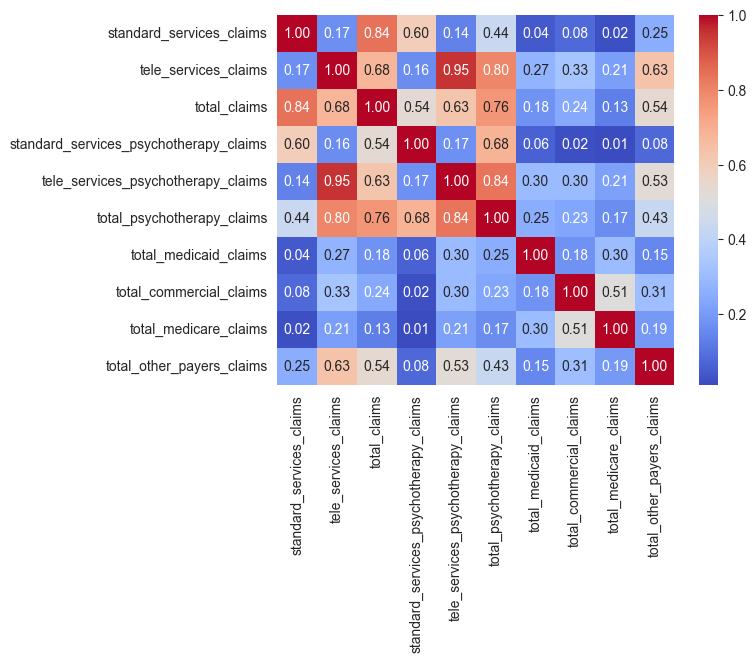

In [35]:
# exploring preliminary correlation matrix of columns
# columns with claims in the name 
corr_claims = data[claims_columns].corr()
sns.heatmap(corr_claims, cmap='coolwarm', fmt=".2f", annot=True)

<Axes: >

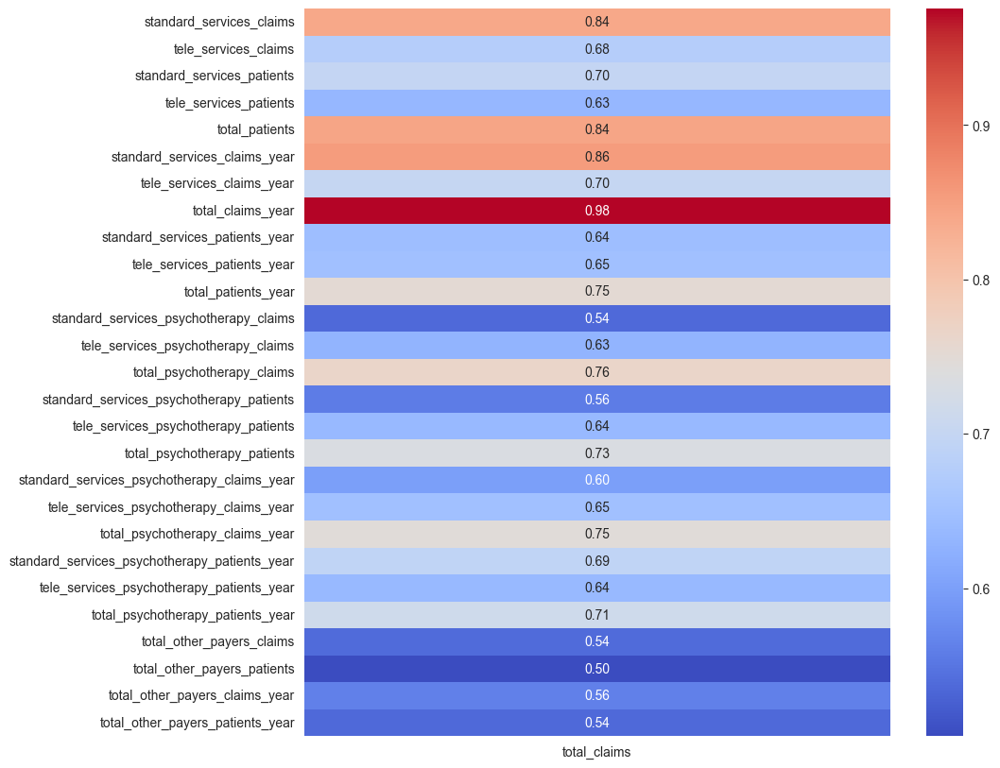

In [36]:
# exploring which columns are correlated with total_claims
numerical_cols = data.select_dtypes(include=np.number) #DO WE NEED THIS?
corr_total_claims = numerical_cols.corr()['total_claims']
corr_total_claims = corr_total_claims[corr_total_claims.abs() > 0.5]
corr_total_claims = corr_total_claims.drop('total_claims')
# make figure size bigger to see each cell clearly 
plt.figure(figsize=(10, 10))
sns.heatmap(corr_total_claims.to_frame(), cmap='coolwarm', annot=True, fmt=".2f")

In [37]:
categorical_cols = data.select_dtypes(include='object').columns
print(categorical_cols)

Index(['Healthcare_Provider_Taxonomy_Code_1', 'Grouping_1', 'Classification_1',
       'Specialization_1', 'Display_Name_1', 'countyname', 'urbanity',
       'provider_size', 'owner_identification', 'business_status',
       'working_hours_cleaned', 'Weekend Availability',
       'Availability Before 8AM', 'Availability After 5PM'],
      dtype='object')


In [38]:
# # one hot encoding the categorical columns and then calculating correlation with total_claims
# # dropping grouping
# cat_cols = data[categorical_cols].drop(['Healthcare_Provider_Taxonomy_Code_1', 'Grouping_1', 'Classification_1', 'Display_Name_1'], axis=1)
# encoder = OneHotEncoder()
# encoded_data = encoder.fit_transform(cat_cols)
# encoded_data = pd.DataFrame(encoded_data.toarray(), columns=encoder.get_feature_names_out())
# encoded_corr = encoded_data.corr()
# # mapping correlations that are greater than or equal to 0.20
# encoded_corr_high = encoded_corr[encoded_corr >= abs(0.2)]
# sns.heatmap(encoded_corr_high, cmap='coolwarm', annot=True, fmt=".2f")

In [39]:
# encoded_data['total_claims'] = data['total_claims']
# encoded_data.head()

## 3. Feature engineering

Exploring the specializations, classifications, and groupings.

In [40]:
grouped_specialization = data.groupby('Specialization_1')['total_claims'].sum()
grouped_specialization = grouped_specialization[grouped_specialization > grouped_specialization.mean()]

# makes the grouping as dataframes
df_specialization = grouped_specialization.reset_index(name='Sum of Total Claims')

Maybe we consider OHE the Grouping_1, Specialization_1, and Classification_1 columns with the top significant columns from each grouping, meaning they appear the most for total_claims breakdown.

In [41]:
top_specialization = df_specialization.sort_values(by='Sum of Total Claims', ascending=False).head(15)

#### 3.1 Specialization, groupings and classification

In [42]:
# Trying to impute the null values in the 'Specialization_1' column, we analyze the common text in the corresponding values of the first and third columns; if any part of the common text matches any of the existing specializations, we replace the null value with it; otherwise, we add the common text 
from functools import lru_cache

df_null_specialization_1 = data[data['Specialization_1'].isnull()][['Classification_1', 'Specialization_1', 'Display_Name_1']]

@lru_cache(maxsize=None)
def longest_common_substring(s1, s2):
    m = [[0] * (1 + len(s2)) for _ in range(1 + len(s1))]
    longest, x_longest = 0, 0
    for x in range(1, 1 + len(s1)):
        for y in range(1, 1 + len(s2)):
            if s1[x - 1] == s2[y - 1]:
                m[x][y] = m[x - 1][y - 1] + 1
                if m[x][y] > longest:
                    longest = m[x][y]
                    x_longest = x
            else:
                m[x][y] = 0
    return s1[x_longest - longest: x_longest]

unique_values = set(data['Specialization_1'].dropna().unique())

def common_substring(row):
    classification = str(row['Classification_1'])
    display_name = str(row['Display_Name_1'])
    common_string = longest_common_substring(classification, display_name)

    excluded_values = ['health', 'medical', 'registered', "children"]
    
    unique_values_matched = [value for value in unique_values
                             if value.lower() not in excluded_values
                             and value in common_string]
    if unique_values_matched:
        return ' '.join(unique_values_matched)  # if there are any matches within unique_values, we return them joined by a space
    else:
        return common_string  # else, we return the common_string itself

df_null_specialization_1['common_text'] = df_null_specialization_1.apply(common_substring, axis=1)
df_null_specialization_1['common_text'].head()

13           Family
14            Doula
18         Clinical
19    Social Worker
23       Pediatrics
Name: common_text, dtype: object

In [43]:
# Impute common_text values into Specialization_1 column of original data and output the new list of unique values
data_engineered = data.copy()
data_engineered.loc[df_null_specialization_1.index, 'Specialization_1'] = df_null_specialization_1['common_text']
unique_values_after_imputation = data_engineered['Specialization_1'].unique()

In [44]:
# Overview of the new specializations added
# Convert your arrays of unique values into sets
unique_values_after_imputation_set = set(unique_values_after_imputation)

# Get the new unique values after imputation by finding the set difference
new_unique_values = unique_values_after_imputation_set - unique_values

# Print the new unique values
print(list(new_unique_values))

['Developmental Therapist', 'Midwife', 'Psychiatric ', 'Chiropractor', 'Obstetrics Gynecology', 'Otolaryngology', 'Psychiatric Hospital', 'Assisted Living Facility', 'Nutritionist', 'Specialist', 'Doula', 'Internal Medicine', 'Neurological Surgery', 'Case Manager/Care Coordinator', 'Legal Medicine', 'Physician Assistant', 'Dermatology', 'Counselor', 'Skilled Nursing Facility', 'Custodial Care Facility', 'Pharmacist', 'Preferred Provider Organization', 'Neuromusculoskeletal Medicine & OMM', 'Health Maintenance Organization', 'Behavior', 'Psychiatric Residential Treatment Facility', 'Nurse Practitioner', 'Pharmacy', 'Community Based Residential Treatment Facility', 'Clinic/Center', 'Student in an Organized Health Care Education/Training Program', 'Case Management', 'Respiratory Therapist', 'Home Infusion', 'Occupational Therapy Assistant', 'Residential Treatment Facility', 'Nursing Facility/Intermediate Care Facility', 'Orthopaedic Surgery', 'Social Worker', 'Developmentally Disabled Ser

This list of values shows that the null values in the Specialization_1 column do not mean there was no Specialization for a reason, just that this information was missing.

In [45]:
# exploring Specialization_1 after imputation
grouped_specialization1 = data_engineered.groupby('Specialization_1')['total_claims'].sum()
# grouped_specialization1 = grouped_specialization1[grouped_specialization1 > grouped_specialization1.mean()]

df_specialization1 = grouped_specialization1.reset_index(name='Sum of Total Claims')

top_specialization1 = df_specialization1.sort_values(by='Sum of Total Claims', ascending=False).head(15)

In [46]:
# Comparing the ranking of significant specializations before and after imputations
for i in range(15):  # we are printing top 15, hence the range
    print(f"{i+1} | {bold}{top_specialization['Specialization_1'].iloc[i]}{reset}: {top_specialization['Sum of Total Claims'].iloc[i]} | {bold}{top_specialization1['Specialization_1'].iloc[i]}{reset}: {top_specialization1['Sum of Total Claims'].iloc[i]}")

1 | Clinical: 767474 | Clinical: 882715
2 | Mental Health: 547540 | Mental Health: 547540
3 | Professional: 475062 | Professional: 475062
4 | Psychiatry: 345573 | Psychiatry: 345573
5 | Addiction (Substance Use Disorder): 119066 | Family: 326884
6 | Pain Medicine: 43153 | Psychologist: 285669
7 | Adolescent and Children Mental Health: 38464 | Pediatrics: 153585
8 | Mental Health (Including Community Mental Health Center): 37101 | Counselor: 133788
9 | Counseling: 32075 | General Acute Care Hospital: 130204
10 | Family: 31065 | Addiction (Substance Use Disorder): 119066
11 | Psychiatric/Mental Health: 28853 | Community/Behavioral Health: 111725
12 | Pastoral: 25350 | Specialist: 79711
13 | VA: 24522 | Physician Assistant: 74433
14 | Child & Adolescent Psychiatry: 22451 | Internal Medicine: 73591
15 | Multi-Specialty: 21670 | Clinic/Center: 60295


Some values are similar and contain similar values like "Mental Health". Therefore, we explore the groups of values that share these words and then the others to see what other lists of values can be looked at.

In the overview of classifications above, we saw a high value of total claims for Counselor. Therefore, we explore the corresponding Specializations for this Classification below. Filter data where 'Classification_1' is 'Counselor'

In [47]:
filtered_data_counselor = data_engineered[data_engineered['Classification_1'] == 'Counselor'][['total_claims', 'Classification_1', 'Specialization_1','Display_Name_1']]

In [48]:
filtered_data_counselor.head()

,total_claims,Classification_1,Specialization_1,Display_Name_1
0,0,Counselor,Addiction (Substance Use Disorder),Addiction (Substance Use Disorder) Counselor
1,0,Counselor,Addiction (Substance Use Disorder),Addiction (Substance Use Disorder) Counselor
2,2,Counselor,Addiction (Substance Use Disorder),Addiction (Substance Use Disorder) Counselor
3,6,Counselor,Addiction (Substance Use Disorder),Addiction (Substance Use Disorder) Counselor
4,0,Counselor,Addiction (Substance Use Disorder),Addiction (Substance Use Disorder) Counselor


In [49]:
# Get total sum of 'total_claims' for 'Counselor' classification
total_counselor_claims = filtered_data_counselor['total_claims'].sum()

# Group by 'Specialization_1' and sum 'total_claims'
grouped_specialization_claims = filtered_data_counselor.groupby('Specialization_1')['total_claims'].sum()

# Initialize an empty dictionary to hold the specializations and their percentages
specialization_percentages = {}

# Iterate over the grouped data
for specialization, total_specialization_claims in grouped_specialization_claims.items():
    # Calculate percentage
    percentage = (total_specialization_claims / total_counselor_claims) * 100

    # Add the specialization and its percentage to the dictionary
    specialization_percentages[specialization] = percentage

# Sort specialization_percentages by percentage, in descending order
sorted_specialization_percentages = dict(sorted(specialization_percentages.items(), key=lambda item: item[1], reverse=True))

# Print each specialization and its percentage
print("Specializations classified as 'Counselor':")
for specialization, percentage in sorted_specialization_percentages.items():
    print(f"{bold}{specialization}{reset}: {round(percentage,2)}%")

Specializations classified as 'Counselor':
Mental Health: 42.11%
Professional: 36.53%
Counselor: 10.29%
Addiction (Substance Use Disorder): 9.06%
Pastoral: 1.95%
School: 0.06%


This shows that the 'Counselor' classification applies to multiple categories, due to which we attribute all these specializations to Mental Health as well.

In [50]:
# Checking if the "Professional" specialization involves only counseling
filtered_df = data_engineered[(data_engineered['Specialization_1'] == 'Professional') &
                 (data_engineered['Classification_1'] != 'Counselor')]

In [51]:
# Checking if the "Addiction (Substance Use Disorder)" specialization involves only counseling
filtered_df1 = data[(data['Specialization_1'] == 'Addiction (Substance Use Disorder)') &
                    (data['Classification_1'] != 'Counselor')][['Classification_1','Specialization_1']]

filtered_df1.head()

,Classification_1,Specialization_1
6706,Psychologist,Addiction (Substance Use Disorder)
6750,Psychologist,Addiction (Substance Use Disorder)
11529,Psychologist,Addiction (Substance Use Disorder)
14970,Psychologist,Addiction (Substance Use Disorder)
17940,Psychologist,Addiction (Substance Use Disorder)


In [52]:
# Checking if the "Addiction Medicine" can also fall under Mental Health
filtered_df2 = data[data['Specialization_1'] == 'Addiction Medicine'][['Classification_1','Specialization_1']]
filtered_df2.head()

,Classification_1,Specialization_1
5908,Preventive Medicine,Addiction Medicine
6301,Preventive Medicine,Addiction Medicine
7260,Psychiatry & Neurology,Addiction Medicine
7486,Psychiatry & Neurology,Addiction Medicine
7492,Psychiatry & Neurology,Addiction Medicine


In [53]:
# Exploring the frequency of different specializations under Psychiatry & Neurology by calculating the % of total records each of them accounts for
filtered_df3 = data[data['Classification_1'] == 'Psychiatry & Neurology'][['Classification_1','Specialization_1','total_claims']]

total_records = filtered_df3.shape[0]

specialization_counts = filtered_df3['Specialization_1'].value_counts()
specialization_percentages = (specialization_counts / total_records) * 100
sorted_specialization_percentages = specialization_percentages.sort_values(ascending=False)

print("All specializations that are classified as Psychiatry & Neurology (with percentage of total records):")
for value, percentage in sorted_specialization_percentages.items():
    print(f"{bold}{value}{reset}: {round(percentage,2)}%")

All specializations that are classified as Psychiatry & Neurology (with percentage of total records):
Psychiatry: 77.68%
Child & Adolescent Psychiatry: 8.43%
Neurology: 6.42%
Addiction Medicine: 1.82%
Geriatric Psychiatry: 1.53%
Forensic Psychiatry: 0.96%
Addiction Psychiatry: 0.77%
Neuromuscular Medicine: 0.57%
Sleep Medicine: 0.57%
Clinical Neurophysiology: 0.48%
Neurology with Special Qualifications in Child Neurology: 0.38%
Pain Medicine: 0.29%
Psychosomatic Medicine: 0.1%


In [54]:
# Exploring the total claims per specialization under Psychiatry & Neurology
df3_total_claims = data[data['Classification_1'] == 'Psychiatry & Neurology'].groupby('Specialization_1')['total_claims'].sum()

sorted_total_claims = df3_total_claims.sort_values(ascending=False)

print("All specializations that are classified as Psychiatry & Neurology (with total claims):")
for specialization, total_claims in sorted_total_claims.items():
    print(f"{bold}{specialization}{reset}: {total_claims}")

All specializations that are classified as Psychiatry & Neurology (with total claims):
Psychiatry: 345573
Child & Adolescent Psychiatry: 22451
Addiction Medicine: 8067
Neurology: 6066
Geriatric Psychiatry: 4020
Addiction Psychiatry: 1408
Forensic Psychiatry: 1117
Sleep Medicine: 493
Neurology with Special Qualifications in Child Neurology: 311
Clinical Neurophysiology: 186
Pain Medicine: 135
Psychosomatic Medicine: 78
Neuromuscular Medicine: 66


The results above show that "Professional" involves counseling only, and "Addiction (Substance Use Disorder)" falls under counseling/psychology. Therefore, both specializations and could be also considered part of "Mental Health". Addiction Medicine could also be treated as "Mental Health", since in a vast majority of the cases, it is classified as Psychiatry & Neurology.

When we look at the Psychiatry & Neurology classification in general, we can see other specializations there like Neurology, Sleep Medicine, Pain Medicine, etc. Since it is hard to [draw the line between psychiatry and neurology](https://www.ncbi.nlm.nih.gov/pmc/articles/PMC1123428/), we consider all the specializations classified as such under Mental Health as well.

Finally, we include the following values under mental health: "Community/Behavioral Health", "Clinical Neurophysiology","Neurodevelopmental Disabilities", "Cognitive & Behavioral", "Behavior", "Behavior Technician", "Rehabilitation, Substance Use Disorder" ([Source1](https://www.thenationalcouncil.org/program/ccbhc-success-center/ccbhc-overview/), [Source2](https://www.kcl.ac.uk/research/mental-health-problems-in-neurodevelopmental-disorders#:~:text=Children%20and%20adolescents%20with%20neurodevelopmental,be%20recognized%2C%20diagnosed%20and%20treated.)). This is done below.

In [55]:
# In addition to combining different mental-health-related specializations, we look at the sorted number of total claims
# per specialization and the total mental-health-related claims vs. non-mental-health claims
# The phrases or string patterns we're looking for:
search_phrases = ["mental health", "psych", "professional", "counselor", "counseling", "addiction",
                  "community/behavioral health", "clinical neurophysiology", "neurodevelopmental disabilities",
                  "cognitive & behavioral", "behavior", "behavior technician", "rehabilitation, substance use disorder"]

# Initialize the lists for matching and non-matching values
matching_values = []
non_matching_values = []

# Iterate over all unique values
for value in unique_values_after_imputation:
    lower_value = str(value).lower()
    
    # Check if any of the phrases is in 'value'
    if any(phrase in lower_value for phrase in search_phrases):
        matching_values.append(value)
    else:
        non_matching_values.append(value)

# Add to matching_values where Classification_1 is Psychiatry & Neurology and not in exclude_specializations
more_matching_values = data_engineered[data_engineered['Classification_1'] == 'Psychiatry & Neurology']['Specialization_1'].unique()
matching_values.extend(more_matching_values)

non_matching_values = list(set(non_matching_values) - set(more_matching_values))

category_total_claims = {}
    
matching_sum = data_engineered[data_engineered['Specialization_1'].isin(matching_values)]['total_claims'].sum()
non_matching_sum = data_engineered[data_engineered['Specialization_1'].isin(non_matching_values)]['total_claims'].sum()

print(f"Sum of 'total_claims' for {bold}mental-health-related claims{reset}: {matching_sum} | {round(matching_sum/(matching_sum+non_matching_sum)*100,2)}% of total claims.")
print(f"Sum of 'total_claims' for {bold}non-mental-health claims{reset}: {non_matching_sum} | {round(non_matching_sum/(matching_sum+non_matching_sum)*100,2)}% of total claims.")

# Iterate over all matching values (mental health categories)
for category in matching_values:
    total_claims = data_engineered[data_engineered['Specialization_1'] == category]['total_claims'].sum()

    category_total_claims[category] = total_claims

sorted_category_total_claims = dict(sorted(category_total_claims.items(), key=lambda item: item[1], reverse=True))

print("\nBreakdown of mental health categories (total claims sum):")
for category, total_claims in sorted_category_total_claims.items():
    print(f"{bold}{category}{reset}: {total_claims}")

Sum of 'total_claims' for mental-health-related claims: 2300577 | 51.01% of total claims.
Sum of 'total_claims' for non-mental-health claims: 2209621 | 48.99% of total claims.

Breakdown of mental health categories (total claims sum):
Mental Health: 547540
Professional: 475062
Psychiatry: 345573
Psychologist: 285669
Counselor: 133788
Addiction (Substance Use Disorder): 119066
Community/Behavioral Health: 111725
Pain Medicine: 43153
Adolescent and Children Mental Health: 38464
Mental Health (Including Community Mental Health Center): 37101
Counseling: 32075
Psychiatric/Mental Health: 28853
Child & Adolescent Psychiatry: 22451
Psychiatric Hospital: 14578
Adult Mental Health: 11148
Psychiatric Residential Treatment Facility: 11098
Addiction Medicine: 8740
Neurology: 6066
Behavior: 6013
Psychiatric : 4471
Geriatric Psychiatry: 4020
Psychiatric/Mental Health, Adult: 2251
Behavior Technician: 1937
Rehabilitation, Substance Use Disorder: 1768
Group Psychotherapy: 1500
Addiction Psychiatry: 14

In [56]:
# Creating a Mental Health column
data_engineered['mental_health'] = data_engineered['Specialization_1'].isin(matching_values).astype(int)

In [57]:
data_engineered['mental_health'].value_counts()

mental_health
0    50724
1    34712
Name: count, dtype: int64

In [58]:
data_engineered['specialization_group'] = data_engineered['Specialization_1'].apply(lambda x: specialization_dict.get(x, 'mental_health'))

In [59]:
# Checking the number of claims per Specialization Group
grouped_claims = data_engineered.groupby('specialization_group')['total_claims'].sum()
sorted_grouped_claims = grouped_claims.sort_values(ascending=False)

for group, total in sorted_grouped_claims.items():
    print(f"{bold}{group}{reset}: {total}")

mental_health: 2300577
Multi-Specialty Groups and Organizations: 1010253
Primary Care and General Practice: 440515
Facility-Based Services: 279544
Pediatrics: 174151
Internal Medicine and Specialties: 93726
Community and Social Services: 58698
Specialized and Allied Health Services: 44978
Emergency and Critical Care: 42874
Rehabilitation and Therapy: 28955
Primary Care and General: 13408
Women Health: 10702
Surgery and Related Specialties: 6998
Public Health and Preventive Medicine: 2959
Medical Imaging and Radiology: 1860


#### 3.2 Working hours

In this section we'll deal with the columns "business_status", "Weekend Availability", "Availability Before 8AM", "Availability After 5PM"

Let's check the unavailable data.

In [60]:
columns = [
    "business_status",
    "Weekend Availability",
    "Availability Before 8AM",
    "Availability After 5PM"
]

unavailable_df = data_engineered[columns]

Checking if the rows where 'business_status' is 'Info Not Available' has the same value in the following columns as well:

In [61]:
info_not_available_df = data_engineered[data_engineered['business_status'] == 'Info Not Available']

columns_to_check = [
    "Weekend Availability",
    "Availability Before 8AM",
    "Availability After 5PM"
]

same_values = all(
    info_not_available_df[col].nunique() <= 1 for col in columns_to_check
)

print(f"All rows with 'Info Not Available' in 'business_status' have the same values in other indicated columns: {bold}{same_values}{reset}")

All rows with 'Info Not Available' in 'business_status' have the same values in other indicated columns: True


We create a separate column 'working_hours_owner_missing_info' that will correspond to all the rows for the four columns above

In [62]:
data_engineered['working_hours_owner_missing_info'] = (data_engineered['business_status'] == 'Info Not Available').astype(int)

In [63]:
data_engineered['working_hours_owner_missing_info'].value_counts()

working_hours_owner_missing_info
1    55560
0    29876
Name: count, dtype: int64

Lets make the column "business_status" more simple by joining "closed" status, since there are not a lot with "closed temporarily"

In [64]:
data_engineered["business_status"].value_counts()

business_status
Info Not Available    55560
OPERATIONAL           27584
CLOSED_PERMANENTLY     2188
CLOSED_TEMPORARILY      104
Name: count, dtype: int64

In [65]:
# Replace values
data_engineered['business_status'] = data_engineered['business_status'].replace({
    'CLOSED_PERMANENTLY': 'CLOSED',
    'CLOSED_TEMPORARILY': 'CLOSED'})

In [66]:
data_engineered['business_status'].value_counts()

business_status
Info Not Available    55560
OPERATIONAL           27584
CLOSED                 2292
Name: count, dtype: int64

Let's deal with the other columns

In [67]:
data_engineered["Availability Before 8AM"].value_counts()

Availability Before 8AM
Info Not Available    55560
No                    27972
Yes                    1904
Name: count, dtype: int64

In [68]:
data_engineered["Availability After 5PM"].value_counts()

Availability After 5PM
Info Not Available    55560
No                    24792
Yes                    5084
Name: count, dtype: int64

In [69]:
data_engineered["Weekend Availability"].value_counts()

Weekend Availability
Info Not Available    55560
No                    27244
Yes                    1372
Only Saturday          1244
Only Sunday              16
Name: count, dtype: int64

Since "Only Sunday" holds a few records, lets just turn everything into something like "partially" available

In [70]:
data_engineered['Weekend Availability'] = data_engineered['Weekend Availability'].replace({
    'Only Saturday': 'Partially',
    'Only Sunday': 'Partially'})

#### 3.3 Ownership

In [71]:
data_engineered['black_owned'].value_counts()

black_owned
0    85320
1      116
Name: count, dtype: int64

In [72]:
data_engineered['latino_owned'].value_counts()

latino_owned
0    85424
1       12
Name: count, dtype: int64

In [73]:
data_engineered['lgbtq+_owned'].value_counts()

lgbtq+_owned
0    85428
1        8
Name: count, dtype: int64

In [74]:
data_engineered['veteran_owned'].value_counts()

veteran_owned
0    85384
1       52
Name: count, dtype: int64

In [75]:
data_engineered['women_owned'].value_counts()

women_owned
0    84756
1      680
Name: count, dtype: int64

In [76]:
data_engineered['owner_identification'].value_counts()

owner_identification
Info Not Available           84724
Women Owned                    544
Black Women Owned              108
Veteran Owned                   24
Veteran Women Owned             24
Latino Owned                     4
Black Veteran Women Owned        4
Black Owned                      4
Name: count, dtype: int64

Checking the consistency in missing values between ownership and working hours

In [77]:
columns_to_check = ["owner_identification"]

same_values = all(
    info_not_available_df[col].nunique() <= 1 for col in columns_to_check
)

print(f"All rows with 'Info Not Available' in 'business_status' have the same values in other indicated columns: {bold}{same_values}{reset}")

All rows with 'Info Not Available' in 'business_status' have the same values in other indicated columns: True


Since we created the column with "is missing" for the working hours and it is consistent on those columns, I'll create a variable that tells if it is minority owned of not

In [78]:
data_engineered['minority_owned'] = data_engineered['owner_identification'].apply(
    lambda x: 0 if x == 'Info Not Available' else 1
)

In [79]:
data_engineered['minority_owned'].value_counts()

minority_owned
0    84724
1      712
Name: count, dtype: int64

#### 3.4 Languages spoken

The same happens with the number of languages. If the info is missing on the other columns, this value is 0 or 23, which is very weird. I believe it is an error, therefore I’ll correct 23 to 0 and treat as missing value.

In [80]:
check = data_engineered[['business_status', 'Spoken_Language_Accessibility']]

check = check.loc[check['business_status'] == 'Info Not Available', :]

check['Spoken_Language_Accessibility'].value_counts()

Spoken_Language_Accessibility
0     55176
23      384
Name: count, dtype: int64

In [81]:
data_engineered['Spoken_Language_Accessibility'].value_counts()

Spoken_Language_Accessibility
0     84356
23      660
1       372
2        40
3         8
Name: count, dtype: int64

Check if the ones that only speak is language is actually english

In [82]:
check_2 = data_engineered.loc[data_engineered['Spoken_Language_Accessibility'] == 1, :]

In [83]:
check_2['EN_English'].value_counts()

EN_English
1    272
0    100
Name: count, dtype: int64

It is not the case, so I'll do the following: I'll subtract 1 from the "Spoken_Language_Accessibility" in the case of one of the languages being English and I'll convert 23 to 0, since I believe it is an error.

In [84]:
# Subtract 1 from Spoken_Language_Accessibility if EN_English is 1
data_engineered['extra_languages_spoken'] = data_engineered.apply(
    lambda row: row['Spoken_Language_Accessibility'] - 1 if row['EN_English'] == 1 else row['Spoken_Language_Accessibility'], 
    axis=1
)

In [85]:
data_engineered['extra_languages_spoken'] = data_engineered['extra_languages_spoken'].replace(23, 0)

#### 3.5 Providers per county

Creating providers per county (the number of providers per county for the year of the record: it would be the number of providers for the respective country for that year)

In [86]:
# Create grouped dataframes
provider_group = data_engineered.groupby('npi')
county_group = data_engineered.groupby('countyID')

In [87]:
# Get the number of providers per county for each year
providers_per_county_year = data_engineered.groupby(['countyID', 'service_year'])['npi'].nunique()

# This is a multi-index series (i.e., series with multiple indices: countyID and Year)
# So we will reset its index to make it a DataFrame, making it easier to merge with the original data
providers_per_county_year = providers_per_county_year.reset_index()
providers_per_county_year.rename(columns={'npi': 'providers_per_county'}, inplace=True)

# Merge this DataFrame with the original data to get the providers per county for the respective year in each record
data_engineered = pd.merge(data_engineered, providers_per_county_year, on=['countyID', 'service_year'], how='left')

In [88]:
# Checking if the new columns have been added to the DataFrame and view their first few rows:
data_engineered[['npi', 'countyID', 'providers_per_county']].head(10)

,npi,countyID,providers_per_county
0,1,51,461
1,1,51,461
2,1,51,461
3,1,51,461
4,1,51,332
5,1,51,332
6,7,101,80
7,8,119,1402
8,9,119,1402
9,10,49,74


In [89]:
# Statistical summaries of the new columns:
data_engineered[['providers_per_county']].describe()

,providers_per_county
count,85436.000000
mean,437.395805
std,392.314279
min,1.000000
25%,91.000000
50%,356.000000
75%,683.000000
max,1402.000000


In [90]:
# Manually checking whether Providers per county were calculated correctly, based on countyID 39
selected_data = data_engineered[data_engineered['countyID'] == 39][['npi', 'service_year', 'total_claims', 'total_patients', 'providers_per_county']]
selected_data.head(10)

,npi,service_year,total_claims,total_patients,providers_per_county
46,45,2020,0,0,8
145,45,2020,0,0,8
461,45,2020,0,0,8
1057,554,2020,0,0,8
1088,577,2020,0,0,8
1096,554,2020,0,0,8
1150,577,2020,0,0,8
1509,867,2020,0,0,8
1566,867,2020,0,0,8
2271,577,2020,0,0,8


#### 3.6 Date feature

In [91]:
data_engineered['year_quarter'] = data_engineered['service_year'].astype(str) + ' Q' + data_engineered['service_quarter'].astype(str)

#### 3.7 Lagged variables

Total claims

In [92]:
# Ensure the DataFrame is sorted by 'npi' and 'year_quarter'
data_engineered = data_engineered.sort_values(by=['npi', 'year_quarter'])

# Create lagged variables for 'total_claims'
data_engineered['total_claims_lag1'] = data_engineered.groupby('npi')['total_claims'].shift(1)
data_engineered['total_claims_lag2'] = data_engineered.groupby('npi')['total_claims'].shift(2)

Teleservices and standard claims (Trying without vectors for now)

If we try with vectors, we could apply PCA or create embeddings

In [93]:
# Create lagged variables for 'standard_services_claims'
data_engineered['standard_services_claims_lag1'] = data_engineered.groupby('npi')['standard_services_claims'].shift(1)
data_engineered['standard_services_claims_lag2'] = data_engineered.groupby('npi')['standard_services_claims'].shift(2)

In [94]:
# Create lagged variables for 'tele_services_claims'
data_engineered['tele_services_claims_lag1'] = data_engineered.groupby('npi')['tele_services_claims'].shift(1)
data_engineered['tele_services_claims_lag2'] = data_engineered.groupby('npi')['tele_services_claims'].shift(2)

In [95]:
# Create lagged variables for 'total_psychotherapy_claims'
data_engineered['total_psychotherapy_claims_lag1'] = data_engineered.groupby('npi')['total_psychotherapy_claims'].shift(1)
data_engineered['total_psychotherapy_claims_lag2'] = data_engineered.groupby('npi')['total_psychotherapy_claims'].shift(2)

In [96]:
# Create a column for total_non_psychotherapy_claims
data_engineered['total_non_psychotherapy_claims'] = data_engineered['total_claims'] - data_engineered['total_psychotherapy_claims']

In [97]:
# Create lagged variables for 'total_non_psychotherapy_claims'
data_engineered['total_non_psychotherapy_claims_lag1'] = data_engineered.groupby('npi')['total_non_psychotherapy_claims'].shift(1)
data_engineered['total_non_psychotherapy_claims_lag2'] = data_engineered.groupby('npi')['total_non_psychotherapy_claims'].shift(2)

In [98]:
# Create lagged variables for 'standard_services_psychotherapy_claims'
data_engineered['standard_services_psychotherapy_claims_lag1'] = data_engineered.groupby('npi')['standard_services_psychotherapy_claims'].shift(1)
data_engineered['standard_services_psychotherapy_claims_lag2'] = data_engineered.groupby('npi')['standard_services_psychotherapy_claims'].shift(2)

In [99]:
# Create lagged variables for 'tele_services_claims'
data_engineered['tele_services_psychotherapy_claims_lag1'] = data_engineered.groupby('npi')['tele_services_psychotherapy_claims'].shift(1)
data_engineered['tele_services_psychotherapy_claims_lag2'] = data_engineered.groupby('npi')['tele_services_psychotherapy_claims'].shift(2)

In [100]:
data_engineered[['tele_services_claims','tele_services_psychotherapy_claims',]]

,tele_services_claims,tele_services_psychotherapy_claims
199,0,0
130,0,0
165,0,0
331,0,0
54,2,2
...,...,...
85342,0,0
85410,588,0
85394,483,0
85396,529,0


In [101]:
# # Create a new column that is a vector containing 'standard_services_claims' and 'tele_services_claims'
# 
# data_engineered['services_claims_vector'] = data_engineered.apply(
#     lambda row: [row['standard_services_claims'], row['tele_services_claims']], axis=1)

In [102]:
# data_engineered['services_claims_vector_lag1'] = data_engineered.groupby('npi')['services_claims_vector'].shift(1)
# data_engineered['services_claims_vector_lag2'] = data_engineered.groupby('npi')['services_claims_vector'].shift(2)

#### 3.8 Dropping features

In [103]:
data_engineered_filtered = data_engineered.copy()

Dropping useless columns

In [104]:
data_engineered_filtered = data_engineered_filtered.drop(columns=[
    'owner_identification','countyID', 'zip5', 'Healthcare_Provider_Taxonomy_Code_1', 'Classification_1', 'Display_Name_1', 'standard_services_patients', 
    'tele_services_patients', '%psychotherapy_patients', '%stdService_patients', '%teleService_patients', '%tele_psychotherapy_patients', 
    'total_patients', 'standard_services_patients_year', 'tele_services_patients_year', 'total_patients_year', 'standard_services_psychotherapy_patients_year', 
    'tele_services_psychotherapy_patients_year', 'total_psychotherapy_patients_year', '%psychotherapy_patients_year', '%stdService_patients_year', '%teleService_patients_year', 'standard_services_psychotherapy_patients', 'tele_services_psychotherapy_patients', 'total_psychotherapy_patients', 'total_medicaid_patients',
    '%tele_psychotherapy_patients_year', 'psychotherapy_provider_through_taxonomy', 'provided_psychotherapy', 'psychotherapy_provider', 'lat', 'long', 'working_hours_cleaned', 'total_commercial_patients', 'total_medicare_patients', 
    'total_other_payers_patients', 'total_commercial_patients_year', 'total_medicaid_patients_year', 'total_medicare_patients_year', 'total_other_payers_patients_year'])

Dropping columns related to claims

In [105]:
data_engineered_filtered = data_engineered_filtered.drop(columns=['standard_services_psychotherapy_claims', 'tele_services_psychotherapy_claims', 'standard_services_claims_year', 
    'tele_services_claims_year', 'total_claims_year', 'total_psychotherapy_claims', 'total_non_psychotherapy_claims', 'standard_services_psychotherapy_claims_year', 'tele_services_psychotherapy_claims_year', 
    'total_psychotherapy_claims_year', 'total_commercial_claims_year', 'total_medicaid_claims_year', 'total_medicare_claims_year', 'total_other_payers_claims_year'])

Dropping columns related to % of claims

In [106]:
data_engineered_filtered = data_engineered_filtered.drop(columns=['%psychotherapy_claims', '%teleService_claims', '%tele_psychotherapy_claims',
    '%psychotherapy_claims_year', '%teleService_claims_year', '%tele_psychotherapy_claims_year'])

Dropping columns that we'll maybe use

In [107]:
data_engineered_filtered = data_engineered_filtered.drop(columns=['black_owned', 'latino_owned', 'lgbtq+_owned', 'veteran_owned', 'women_owned'])

In [108]:
data_engineered_filtered = data_engineered_filtered.drop(columns=[
    'AH_Sign language services for the deaf and hard of hearing', 'EN_English', 'SP_Spanish', 'NX_American Indian or Alaska Native languages', 
    'FX_Other languages (excluding Spanish)', 'F4_Arabic', 'F17_Any Chinese Language', 'F19_Creole', 'F25_Farsi', 'F28_French', 'F30_German', 'F31_Greek', 'F35_Hebrew', 
    'F36_Hindi', 'F37_Hmong', 'F42_Italian', 'F43_Japanese', 'F47_Korean', 'F66_Polish', 'F67_Portuguese', 'F70_Russian', 'F81_Tagalog', 'F92_Vietnamese', 
    'N24_Ojibwa', 'N40_Yupik', 'Spoken_Language_Accessibility'])

In [109]:
data_engineered_filtered = data_engineered_filtered.drop(columns=['census_tract', 'Specialization_1'])

In [110]:
# dropping the services original column
data_engineered_filtered = data_engineered_filtered.drop(columns=['tele_services_claims', 'standard_services_claims'])

Dropping inconsistent claim columns

In [111]:
data_engineered_filtered = data_engineered_filtered.drop(columns=['total_medicaid_claims', 'total_commercial_claims', 'total_medicare_claims', 'total_other_payers_claims'])

Checking the lagged variable columns

In [112]:
# Check how many rows have 0 on two lags for 'total_claims'
total_claims_lag1_zero = (data_engineered_filtered['total_claims_lag1'] == 0).sum()
total_claims_lag2_zero = (data_engineered_filtered['total_claims_lag2'] == 0).sum()
both_total_claims_lags_zero = ((data_engineered_filtered['total_claims_lag1'] == 0) & (data_engineered_filtered['total_claims_lag2'] == 0)).sum()

print(f"Rows with 0 on total_claims_lag1: {total_claims_lag1_zero}")
print(f"Rows with 0 on total_claims_lag2: {total_claims_lag2_zero}")
print(f"Rows with 0 on both total_claims_lags: {both_total_claims_lags_zero}")

Rows with 0 on total_claims_lag1: 14921
Rows with 0 on total_claims_lag2: 12382
Rows with 0 on both total_claims_lags: 6629


## 4. Encoding

In [113]:
data_encoded = data_engineered_filtered.copy()

In [114]:
data_encoded = data_encoded.fillna(0)

In [115]:
data_encoded.info()

<class 'pandas.core.frame.DataFrame'>
Index: 85436 entries, 199 to 85408
Data columns (total 37 columns):
 #   Column                                       Non-Null Count  Dtype  
---  ------                                       --------------  -----  
 0   npi                                          85436 non-null  int64  
 1   service_year                                 85436 non-null  int64  
 2   service_quarter                              85436 non-null  int64  
 3   total_claims                                 85436 non-null  int64  
 4   Grouping_1                                   85436 non-null  object 
 5   countyname                                   85436 non-null  object 
 6   urbanity                                     85436 non-null  object 
 7   transport_access                             85436 non-null  float64
 8   broadband_access                             85436 non-null  float64
 9   provider_size                                85436 non-null  object 
 10  E

#### 4.1 Encoding categoricals

In [116]:
data_encoded['business_status'] = data_encoded['business_status'].replace({
    'Info Not Available': 0,
    'CLOSED': 0,
    'OPERATIONAL': 1})

In [117]:
data_encoded['weekend_availability'] = data_encoded['Weekend Availability'].replace({
    'Info Not Available': 0,
    'No': 0,
    'Partially': 1,
    'Yes': 2})

data_encoded = data_encoded.drop(columns='Weekend Availability')

# another option
#data_encoded['Weekend Availability'] = data_encoded['Weekend Availability'].replace({
#    'Info Not Available': 0,
#    'No': 0,
#    'Partially': 1,
#    'Yes': 1})

In [118]:
data_encoded['availability_after_5pm'] = data_encoded['Availability After 5PM'].replace({
    'Info Not Available': 0,
    'No': 0,
    'Yes': 1})

data_encoded = data_encoded.drop(columns='Availability After 5PM')

In [119]:
data_encoded['availability_before_8am'] = data_encoded['Availability Before 8AM'].replace({
    'Info Not Available': 0,
    'No': 0,
    'Yes': 1})

data_encoded = data_encoded.drop(columns='Availability Before 8AM')

In [120]:
data_encoded['provider_size'].value_counts()

provider_size
Small    84585
Big        851
Name: count, dtype: int64

In [121]:
data_encoded['provider_size'] = data_encoded['provider_size'].replace({
    'Small': 0,
    'Big': 1})

# another option
#data_encoded['provider_size'] = data_encoded['provider_size'].replace({
#    'Small': 1,
#    'Big': 2})

In [122]:
data_encoded = pd.get_dummies(data_encoded, columns=['Grouping_1'], prefix='grouping_1')

In [123]:
# we can dummy encode or leave it scalar as it is...

# data_encoded = pd.get_dummies(data_encoded, columns=['Entity_Type_Code'], prefix='Entity_Type_Code')

In [124]:
data_encoded = pd.get_dummies(data_encoded, columns=['urbanity'], prefix='urbanity')

In [125]:
data_encoded = pd.get_dummies(data_encoded, columns=['specialization_group'], prefix='specialization_group')

Renaming some columns for coherence

In [126]:
data_encoded = data_encoded.rename(columns={'Entity_Type_Code': 'entity_type_code', 'countyname': 'county_name'})

In [127]:
# encode county_name by target encoding - target is type of claim so we'll need to create a target vector or two models - and we can only do that when we have the target variable and know how to split in train and test
# also need to think how to drop rows.. should we really drop ones that had zeros on the lags?

Row analysis: We will see if the 0s are significant for any providers that are inactive, holding all 0s for all data. If any provider has all 0 values for claims across all the data, we will drop this provider and cross check with the inactive variable.

In [128]:
# grouping by npi and checking if any provider has zero claims for more than 74% of the quarters

zero_claims_percentage = data_encoded.groupby('npi')['total_claims'].apply(lambda x: (x == 0).mean())
zero_claims_percentage = zero_claims_percentage[zero_claims_percentage > 0.74]

print(f"Number of providers with zero claims for more than 74% of the quarters: {zero_claims_percentage.shape[0]}")


Number of providers with zero claims for more than 74% of the quarters: 1537


In [129]:
# exploring if for the providers with zero claims for many quarters, if they have zero claims for the last quarter
zero_claims_last_quarter = data_encoded[(data_encoded['service_quarter'] == 'Q4') & (data_encoded['service_year']==2020)].groupby('npi')['total_claims'].sum()
zero_claims_last_quarter = zero_claims_last_quarter[zero_claims_last_quarter == 0]

print(f"Number of providers with zero claims for the last quarter: {zero_claims_last_quarter.shape[0]}")

Number of providers with zero claims for the last quarter: 0


In [130]:
# how many rows have 0 for total_claims 
zero_claims = (data_encoded['total_claims'] == 0).sum()
print(f"Rows with 0 on total_claims: {zero_claims}/{data_encoded.shape[0]}")

Rows with 0 on total_claims: 17565/85436


Reminder: 'Info Not Available' and 'CLOSED' = 0, 'OPERATIONAL' = 1 for business_status

In [131]:
# checking if rows of 0s for total_claims correspond to business_status variable 
zero_claims_business_status = data_encoded[data_encoded['total_claims'] == 0]['business_status'].value_counts()
print(f"Business status for rows with 0 on total_claims: {zero_claims_business_status}")

Business status for rows with 0 on total_claims: business_status
0    12490
1     5075
Name: count, dtype: int64


Is there ever a situation where the business is closed and then comes back to operational?

In [132]:
# parse through rows for each provider and see if business_status = 0 and then returns to 1 in a latter row (latter quarter and year)
# and if the total_claims are not 0
# if so, we can assume that the provider was closed and then reopened and the 0s are meaningful

for npi in data_encoded['npi'].unique():
    provider_data = data_encoded[data_encoded['npi'] == npi]
    # make sure provider data is ordered by year and quarter
    provider_data = provider_data.sort_values(by=['service_year', 'service_quarter'])
    for i in range(1, len(provider_data)):
        if provider_data['business_status'].iloc[i-1] == 0 and provider_data['business_status'].iloc[i] == 1:
            print(f"Provider {npi} has business_status = 0 and then returns to 1 in a latter row")

Resetting the index to be the npi for modeling purposes.

In [133]:
data_encoded = data_encoded.set_index('npi')
data_encoded.head()

,service_year,service_quarter,total_claims,county_name,transport_access,broadband_access,provider_size,entity_type_code,planning_accepts_new_patients,business_status,mental_health,working_hours_owner_missing_info,minority_owned,extra_languages_spoken,providers_per_county,year_quarter,total_claims_lag1,total_claims_lag2,standard_services_claims_lag1,standard_services_claims_lag2,tele_services_claims_lag1,tele_services_claims_lag2,total_psychotherapy_claims_lag1,total_psychotherapy_claims_lag2,total_non_psychotherapy_claims_lag1,total_non_psychotherapy_claims_lag2,standard_services_psychotherapy_claims_lag1,standard_services_psychotherapy_claims_lag2,tele_services_psychotherapy_claims_lag1,tele_services_psychotherapy_claims_lag2,weekend_availability,availability_after_5pm,availability_before_8am,grouping_1_Agencies,grouping_1_Allopathic & Osteopathic Physicians,grouping_1_Ambulatory Health Care Facilities,grouping_1_Behavioral Health & Social Service Providers,grouping_1_Chiropractic Providers,grouping_1_Dental Providers,grouping_1_Dietary & Nutritional Service Providers,grouping_1_Eye and Vision Services Providers,grouping_1_Hospital Units,grouping_1_Hospitals,grouping_1_Laboratories,grouping_1_Managed Care Organizations,grouping_1_Nursing & Custodial Care Facilities,grouping_1_Nursing Service Providers,grouping_1_Nursing Service Related Providers,grouping_1_Other Service Providers,grouping_1_Pharmacy Service Providers,grouping_1_Physician Assistants & Advanced Practice Nursing Providers,grouping_1_Podiatric Medicine & Surgery Service Providers,grouping_1_Residential Treatment Facilities,"grouping_1_Respiratory, Developmental, Rehabilitative and Restorative Service Providers",grouping_1_Respite Care Facility,"grouping_1_Speech, Language and Hearing Service Providers","grouping_1_Student, Health Care",grouping_1_Suppliers,grouping_1_Transportation Services,urbanity_Rural,urbanity_Urban,specialization_group_Community and Social Services,specialization_group_Emergency and Critical Care,specialization_group_Facility-Based Services,specialization_group_Internal Medicine and Specialties,specialization_group_Medical Imaging and Radiology,specialization_group_Multi-Specialty Groups and Organizations,specialization_group_Pediatrics,specialization_group_Primary Care and General,specialization_group_Primary Care and General Practice,specialization_group_Public Health and Preventive Medicine,specialization_group_Rehabilitation and Therapy,specialization_group_Specialized and Allied Health Services,specialization_group_Surgery and Related Specialties,specialization_group_Women Health,specialization_group_mental_health
npi,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
1,2018,1,8,Cumberland,0.9,0.71,0,1,0,0,1,1,0,0,239,2018 Q1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,0,0,False,False,False,True,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,True,False,False,False,False,False,False,False,False,False,False,False,False,False,False,True
1,2018,2,1,Cumberland,0.9,0.71,0,1,0,0,1,1,0,0,239,2018 Q2,8.0,0.0,8.0,0.0,0.0,0.0,8.0,0.0,0.0,0.0,8.0,0.0,0.0,0.0,0,0,0,False,False,False,True,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,True,False,False,False,False,False,False,False,False,False,False,False,False,False,False,True
1,2018,3,2,Cumberland,0.9,0.71,0,1,0,0,1,1,0,0,239,2018 Q3,1.0,8.0,1.0,8.0,0.0,0.0,1.0,8.0,0.0,0.0,1.0,8.0,0.0,0.0,0,0,0,False,False,False,True,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,True,False,False,False,False,False,False,False,False,False,False,False,False,False,False,True
1,2018,4,5,Cumberland,0.9,0.71,0,1,0,0,1,1,0,0,239,2018 Q4,2.0,1.0,2.0,1.0,0.0,0.0,2.0,1.0,0.0,0.0,2.0,1.0,0.0,0.0,0,0,0,False,False,False,T

## 5. Prepare for modelling

#### 5.1 Checks of prepared data

In [134]:
data_encoded.info()

<class 'pandas.core.frame.DataFrame'>
Index: 85436 entries, 1 to 11383
Data columns (total 76 columns):
 #   Column                                                                                   Non-Null Count  Dtype  
---  ------                                                                                   --------------  -----  
 0   service_year                                                                             85436 non-null  int64  
 1   service_quarter                                                                          85436 non-null  int64  
 2   total_claims                                                                             85436 non-null  int64  
 3   county_name                                                                              85436 non-null  object 
 4   transport_access                                                                         85436 non-null  float64
 5   broadband_access                                                 

In [135]:
# data types of the columns so i can see them all line be line or scrollable output 
for col in data_encoded.columns:
    if data_encoded[col].dtype == 'object':
        print(f"{col}: {data_encoded[col].dtype}")

county_name: object
year_quarter: object


In [136]:
data_encoded['year_quarter'].value_counts()

year_quarter
2020 Q1    8920
2020 Q2    8920
2020 Q3    8920
2020 Q4    8920
2019 Q1    6993
2019 Q2    6993
2019 Q3    6993
2019 Q4    6993
2018 Q1    5446
2018 Q2    5446
2018 Q3    5446
2018 Q4    5446
Name: count, dtype: int64

In [137]:
# we have this information in service_year and service_quarter so we can drop this column
data_encoded = data_encoded.drop(columns='year_quarter')

#### 5.2 Splitting dataset

In [138]:
# splitting data randomly
X = data_encoded.drop(columns='total_claims')
y = data_encoded['total_claims']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# checking if the split is correct
print(f"Training set shape: {X_train.shape}")
print(f"Testing set shape: {X_test.shape}")

Training set shape: (68348, 74)
Testing set shape: (17088, 74)


#### 5.3 Target-Encoding

In [139]:
# target encoding the county_name column 
from category_encoders import TargetEncoder
target_encoder = TargetEncoder()
X_train['county_name'] = target_encoder.fit_transform(X_train['county_name'], y_train)
X_test['county_name'] = target_encoder.transform(X_test['county_name'])

# checking if the target encoding was successful with training set
X_train['county_name'].head()

npi
8544    25.595984
9622    41.211591
9089    34.236912
7208    34.236912
7502    51.720539
Name: county_name, dtype: float64

In [140]:
# checking if the target encoding was successful with test set
X_test['county_name'].head()

npi
10275    68.464076
9312     65.755102
6240     68.464076
11133    47.343621
6764     50.126027
Name: county_name, dtype: float64

## 6. Modelling

In [141]:
''' 
Function to calculate regression metrics for a model.
'''
def regression_metrics(y_true, y_pred):
    # Calculate R2 score
    r2 = r2_score(y_true, y_pred)
    # Calculate Mean Absolute Error
    mae = mean_absolute_error(y_true, y_pred)
    # Calculate Mean Squared Error
    mse = mean_squared_error(y_true, y_pred)
    # Calculate Root Mean Squared Error
    rmse = np.sqrt(mse)
    return r2, mae, mse, rmse

'''
Function to take the output of regression_metrics and print the results.
'''
def print_regression_metrics(y_true, y_pred):
    r2, mae, mse, rmse = regression_metrics(y_true, y_pred)
    print(f"R2 Score: {r2}")
    print(f"Mean Absolute Error: {mae}")
    print(f"Mean Squared Error: {mse}")
    print(f"Root Mean Squared Error: {rmse}")

In [142]:
def plot_feature_importances(model, feature_names):
    importances = model.feature_importances_
    importance_df = pd.DataFrame({
        'Feature': feature_names,
        'Importance': importances
    })
    importance_df = importance_df.sort_values(by='Importance', ascending=False)

    plt.figure(figsize=(10, 6)) # increase the second value here for a taller/shorter figure
    sns.barplot(x='Importance', y='Feature', data=importance_df)
    plt.title('Feature importance')
    plt.tight_layout()

    return importances

In [143]:
def plot_true_pred_claims(model, X_test, y_test, maximum):
    y_pred = model.predict(X_test)
    y_test_array = y_test.to_numpy()

    # Get the indices where y_test_array is 1000 or lower
    indices = np.where(y_test_array <= maximum)

    # Filter y_test_array and y_pred
    filtered_y_test = y_test_array[indices]
    filtered_y_pred = y_pred[indices]

    # Now, go ahead with your plotting
    plt.figure(figsize=(8, 8))

    plt.scatter(filtered_y_test, filtered_y_pred, alpha=0.5)
    plt.plot([min(filtered_y_test), max(filtered_y_test)], [min(filtered_y_test), max(filtered_y_test)],
             color='red')  # identity line

    plt.xlabel('True Total Claims')
    plt.ylabel('Predicted Total Claims')
    plt.title(f'True vs Predicted Total Claims (for True Values <= {maximum})')
    plt.show()

In [144]:
def plot_residuals(model, X_test, y_test):
    y_pred = model.predict(X_test)
    residuals = y_test - y_pred
    plt.figure(figsize=(8, 8))
    plt.scatter(y_test, residuals, alpha=0.5)
    plt.plot([min(y_test), max(y_test)], [0, 0], color='red')  
    plt.xlabel('True Total Claims')
    plt.ylabel('Residuals')
    plt.title('Residual Plot')
    plt.show()

In [385]:
# # basic regression model
# model_lin = LinearRegression()
# model_lin.fit(X_train, y_train)
# y_pred_lin = model.predict(X_test)

# # checking the model performance
# print_regression_metrics(y_test, y_pred_lin)

In [287]:
# # decision tree regression 
# model_dt = DecisionTreeRegressor(random_state=42)
# model_dt.fit(X_train, y_train)
# y_pred_dt = model.predict(X_test)

# # checking the model performance
# print_regression_metrics(y_test, y_pred_dt)

### Random Forest models

Defining the function to train and tune a Random Forest model

In [525]:
import optuna
from xgboost import XGBRegressor
from sklearn.model_selection import cross_val_score
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score

def objective(trial, X, y):
    n_estimators = trial.suggest_int("n_estimators", 100, 500)
    max_depth = trial.suggest_int("max_depth", 10, 50)
    min_samples_split = trial.suggest_int("min_samples_split", 2, 5)
    min_samples_leaf = trial.suggest_int("min_samples_leaf", 1, 5)
    max_features = trial.suggest_float("max_features", 0.1, 1.0)
    bootstrap = trial.suggest_categorical("bootstrap", [True, False])

    rf = RandomForestRegressor(
        n_estimators=n_estimators,
        max_depth=max_depth,
        min_samples_split=min_samples_split,
        min_samples_leaf=min_samples_leaf,
        max_features=max_features,
        bootstrap=bootstrap,
        n_jobs=-1)

    score = cross_val_score(rf, X, y, cv=5, scoring="neg_mean_squared_error")
    return -1 * score.mean()

def random_forest_optuna(X_train, y_train, X_test, y_test, n_trials):
    study = optuna.create_study(direction="minimize")
    study.optimize(lambda trial:objective(trial, X_train, y_train), n_trials=n_trials)
    best_params = study.best_params

    model = RandomForestRegressor(**best_params)
    model.fit(X_train, y_train)

    preds = model.predict(X_test)
    r2, mae, mse, rmse = regression_metrics(y_test, preds)

    print(f"Best params: {best_params}")
    print_regression_metrics(y_test, preds)

    return model

First model with all features

In [498]:
model1 = random_forest_optuna(X_train, y_train, X_test, y_test, 10)

[I 2024-06-20 13:04:06,734] A new study created in memory with name: no-name-2b792f60-fa85-4d84-a2a8-c1c490f616b1
[I 2024-06-20 13:04:13,554] Trial 0 finished with value: 11382.951138525455 and parameters: {'n_estimators': 434, 'max_depth': 10, 'min_samples_split': 5, 'min_samples_leaf': 1, 'max_features': 0.17861771528731973, 'bootstrap': True}. Best is trial 0 with value: 11382.951138525455.
[I 2024-06-20 13:04:35,290] Trial 1 finished with value: 10420.435942484566 and parameters: {'n_estimators': 219, 'max_depth': 42, 'min_samples_split': 4, 'min_samples_leaf': 2, 'max_features': 0.550635445894166, 'bootstrap': True}. Best is trial 1 with value: 10420.435942484566.
[I 2024-06-20 13:05:20,499] Trial 2 finished with value: 10158.644546998712 and parameters: {'n_estimators': 395, 'max_depth': 25, 'min_samples_split': 2, 'min_samples_leaf': 2, 'max_features': 0.6502423762100916, 'bootstrap': True}. Best is trial 2 with value: 10158.644546998712.
[I 2024-06-20 13:05:46,706] Trial 3 fini

Best params: {'n_estimators': 395, 'max_depth': 25, 'min_samples_split': 2, 'min_samples_leaf': 2, 'max_features': 0.6502423762100916, 'bootstrap': True}
R2 Score: 0.9135712021447446
Mean Absolute Error: 16.373074376409804
Mean Squared Error: 4532.110188009999
Root Mean Squared Error: 67.32094910211826


In [499]:
dump(model1, 'model1.joblib')

['model1.joblib']

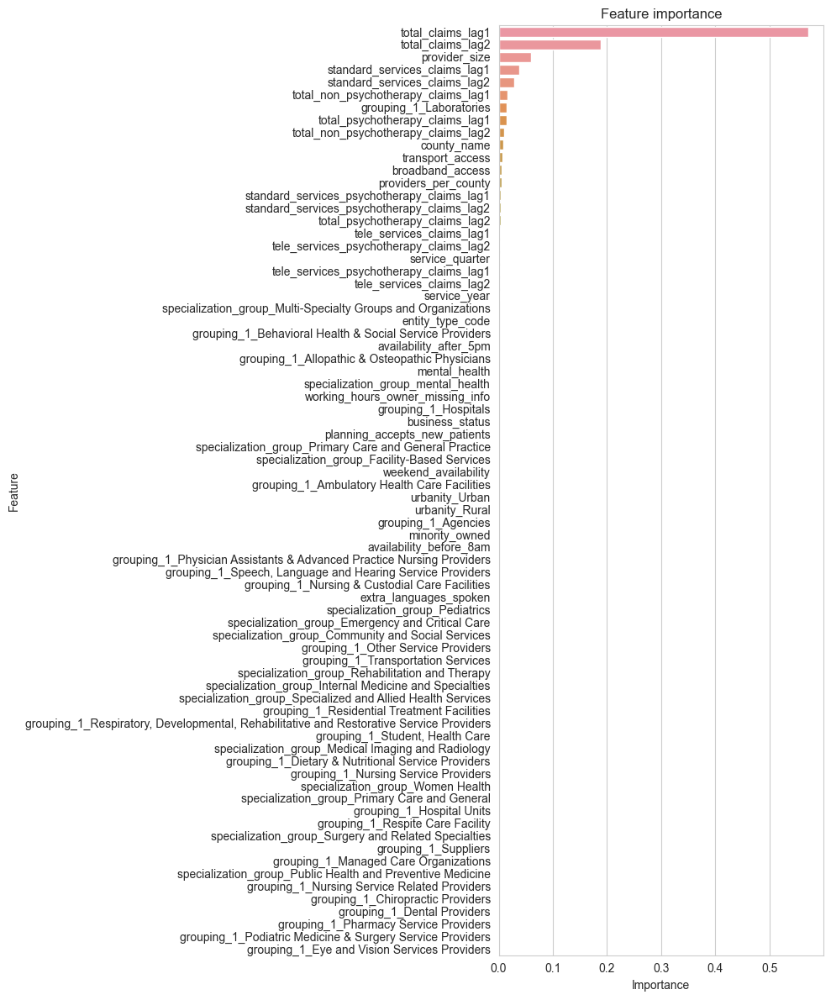

In [501]:
model1_importances = plot_feature_importances(model1, X_train.columns) # change fig size to (10,6) to graph importances for fewer features

The first lag of total claims appears to be the most important and the majority of features have little to no importance.

Training a model with features with 0.5%+ importance

In [602]:
feature_importance_dict = {feature: importance for feature, importance in zip(X_train.columns, model1_importances)}

important_columns = sorted([(feature, importance) for feature, importance in feature_importance_dict.items() if importance >= 0.005], key=lambda x: x[1], reverse=True)

for feature, importance in important_columns:
    print(f'{bold}{feature}{reset}: {round(importance*100, 2)}%')

total_claims_lag1: 57.14%
total_claims_lag2: 18.8%
provider_size: 6.04%
standard_services_claims_lag1: 3.87%
standard_services_claims_lag2: 2.82%
total_non_psychotherapy_claims_lag1: 1.67%
grouping_1_Laboratories: 1.51%
total_psychotherapy_claims_lag1: 1.5%
total_non_psychotherapy_claims_lag2: 1.04%
county_name: 0.87%
transport_access: 0.66%
broadband_access: 0.6%


In [603]:
important_columns = [col[0] for col in important_columns]
X_train_important_both_lags = X_train[important_columns]
X_test_important_both_lags = X_test[important_columns]

In [604]:
model1_important_features = random_forest_optuna(X_train_important_both_lags, y_train, X_test_important_both_lags, y_test, 20)

[I 2024-06-21 22:52:37,684] A new study created in memory with name: no-name-3fe8c26f-eeb6-41e9-93d6-e1615c068272
[I 2024-06-21 22:52:49,678] Trial 0 finished with value: 10109.127371772587 and parameters: {'n_estimators': 103, 'max_depth': 44, 'min_samples_split': 3, 'min_samples_leaf': 2, 'max_features': 0.956816039262439, 'bootstrap': True}. Best is trial 0 with value: 10109.127371772587.
[I 2024-06-21 22:53:11,682] Trial 1 finished with value: 10722.662208985708 and parameters: {'n_estimators': 319, 'max_depth': 34, 'min_samples_split': 5, 'min_samples_leaf': 3, 'max_features': 0.7440452454682163, 'bootstrap': True}. Best is trial 0 with value: 10109.127371772587.
[I 2024-06-21 22:53:23,058] Trial 2 finished with value: 11893.404985230956 and parameters: {'n_estimators': 410, 'max_depth': 34, 'min_samples_split': 3, 'min_samples_leaf': 5, 'max_features': 0.1872582335694302, 'bootstrap': True}. Best is trial 0 with value: 10109.127371772587.
[I 2024-06-21 22:53:37,416] Trial 3 finis

Best params: {'n_estimators': 103, 'max_depth': 44, 'min_samples_split': 3, 'min_samples_leaf': 2, 'max_features': 0.956816039262439, 'bootstrap': True}
R2 Score: 0.9181974382877414
Mean Absolute Error: 17.12756134104778
Mean Squared Error: 4289.521924883525
Root Mean Squared Error: 65.49444193886627


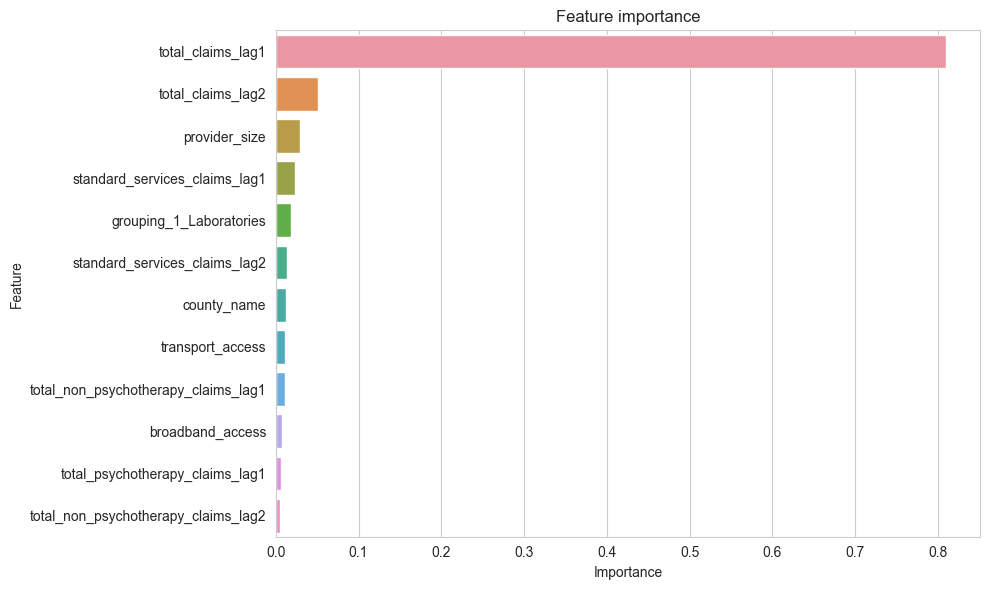

In [607]:
model1_important_features_importances = plot_feature_importances(model1_important_features, X_train_important_both_lags.columns)

In [520]:
dump(model1_important_features, 'model1_important_features.joblib')

['model1_important_features.joblib']

Experimenting with dropping the first lag of total claims to see if removing it significantly affects performance and then training another model with the important features.

In [527]:
X_train1 = X_train.drop('total_claims_lag1', axis=1)
X_test1 = X_test.drop('total_claims_lag1', axis=1)
model1_without_lag1 = random_forest_optuna(X_train1, y_train, X_test1, y_test, 50)

[I 2024-06-21 02:32:48,424] A new study created in memory with name: no-name-d43c8ec0-8de0-43f9-b12c-5743af158c8d
[I 2024-06-21 02:33:00,453] Trial 0 finished with value: 13091.05422606649 and parameters: {'n_estimators': 329, 'max_depth': 25, 'min_samples_split': 5, 'min_samples_leaf': 4, 'max_features': 0.18487229078813014, 'bootstrap': True}. Best is trial 0 with value: 13091.05422606649.
[I 2024-06-21 02:33:16,611] Trial 1 finished with value: 11694.915817467148 and parameters: {'n_estimators': 206, 'max_depth': 10, 'min_samples_split': 4, 'min_samples_leaf': 4, 'max_features': 0.9635201028806506, 'bootstrap': True}. Best is trial 1 with value: 11694.915817467148.
[I 2024-06-21 02:33:23,371] Trial 2 finished with value: 13232.073661641964 and parameters: {'n_estimators': 201, 'max_depth': 41, 'min_samples_split': 5, 'min_samples_leaf': 3, 'max_features': 0.15047446391630231, 'bootstrap': True}. Best is trial 1 with value: 11694.915817467148.
[I 2024-06-21 02:33:49,897] Trial 3 fini

Best params: {'n_estimators': 469, 'max_depth': 12, 'min_samples_split': 3, 'min_samples_leaf': 1, 'max_features': 0.6711054583140479, 'bootstrap': False}
R2 Score: 0.9040924509903252
Mean Absolute Error: 16.751817328658998
Mean Squared Error: 5029.152212689087
Root Mean Squared Error: 70.91651579631565


In [534]:
dump(model1_without_lag1, 'model1_without_lag1.joblib')

['model1_without_lag1.joblib']

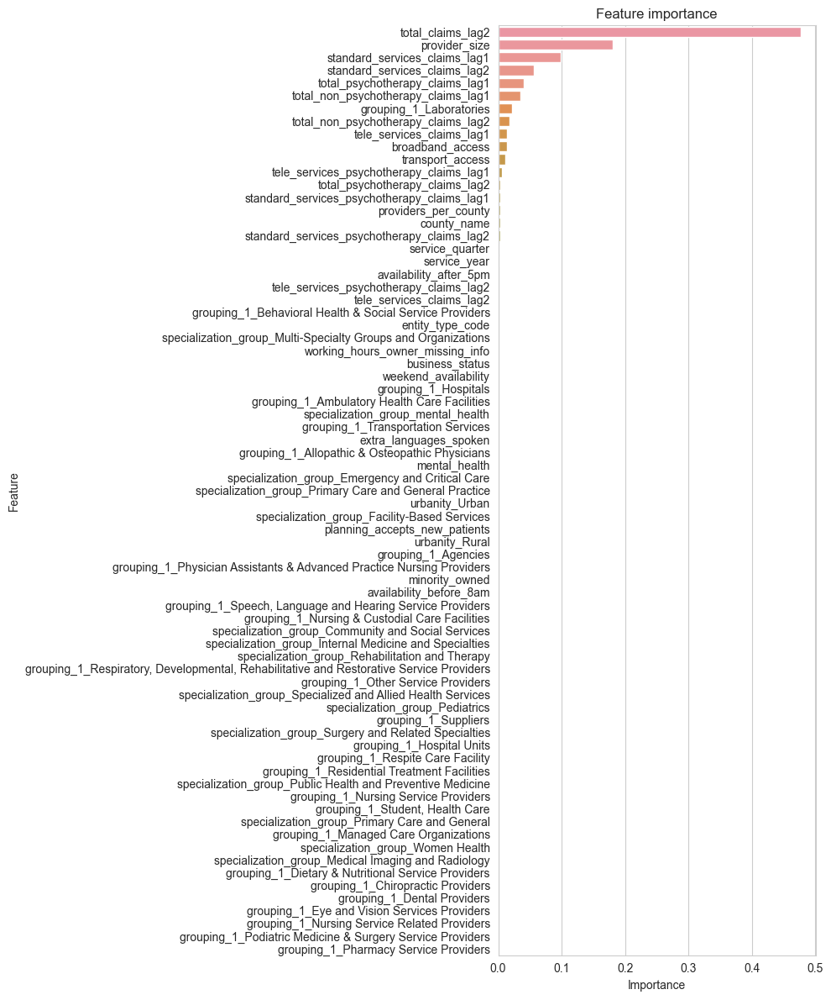

In [532]:
model1_without_lag1_importances = plot_feature_importances(model1_without_lag1, X_train1.columns)

In [552]:
# 1%+ importances
feature_importance_dict = {feature: importance for feature, importance in zip(X_train1.columns, model1_without_lag1_importances)}

important_columns = sorted([(feature, importance) for feature, importance in feature_importance_dict.items() if importance > 0.01], key=lambda x: x[1], reverse=True)

for feature, importance in important_columns:
    print(f'{bold}{feature}{reset}: {round(importance*100, 2)}%')

total_claims_lag2: 47.71%
provider_size: 18.13%
standard_services_claims_lag1: 9.85%
standard_services_claims_lag2: 5.59%
total_psychotherapy_claims_lag1: 4.06%
total_non_psychotherapy_claims_lag1: 3.55%
grouping_1_Laboratories: 2.24%
total_non_psychotherapy_claims_lag2: 1.84%
tele_services_claims_lag1: 1.36%
broadband_access: 1.34%
transport_access: 1.09%


In [553]:
important_columns = [col[0] for col in important_columns]
X_train_important_no_lag1 = X_train[important_columns]
X_test_important_no_lag1 = X_test[important_columns]

In [554]:
model1_without_lag1_important_features = random_forest_optuna(X_train_important_no_lag1, y_train, X_test_important_no_lag1, y_test, 100)

[I 2024-06-21 17:28:13,238] A new study created in memory with name: no-name-4dc4282b-9732-4a1e-8aad-8ca4a1010dea
[I 2024-06-21 17:28:21,347] Trial 0 finished with value: 12278.078787079143 and parameters: {'n_estimators': 353, 'max_depth': 30, 'min_samples_split': 5, 'min_samples_leaf': 1, 'max_features': 0.16519230412717997, 'bootstrap': True}. Best is trial 0 with value: 12278.078787079143.
[I 2024-06-21 17:28:39,599] Trial 1 finished with value: 11204.949201351044 and parameters: {'n_estimators': 359, 'max_depth': 37, 'min_samples_split': 2, 'min_samples_leaf': 1, 'max_features': 0.24630770104232524, 'bootstrap': False}. Best is trial 1 with value: 11204.949201351044.
[I 2024-06-21 17:28:46,145] Trial 2 finished with value: 12290.613228206337 and parameters: {'n_estimators': 181, 'max_depth': 10, 'min_samples_split': 4, 'min_samples_leaf': 5, 'max_features': 0.8656293854160287, 'bootstrap': True}. Best is trial 1 with value: 11204.949201351044.
[I 2024-06-21 17:28:48,767] Trial 3 f

Best params: {'n_estimators': 364, 'max_depth': 29, 'min_samples_split': 3, 'min_samples_leaf': 1, 'max_features': 0.7743124187767313, 'bootstrap': False}
R2 Score: 0.900657994647716
Mean Absolute Error: 18.08955039063187
Mean Squared Error: 5209.246521147277
Root Mean Squared Error: 72.17511012216939


In [ ]:
dump(model1_without_lag1_important_features, 'model1_without_lag1_important_features.joblib')

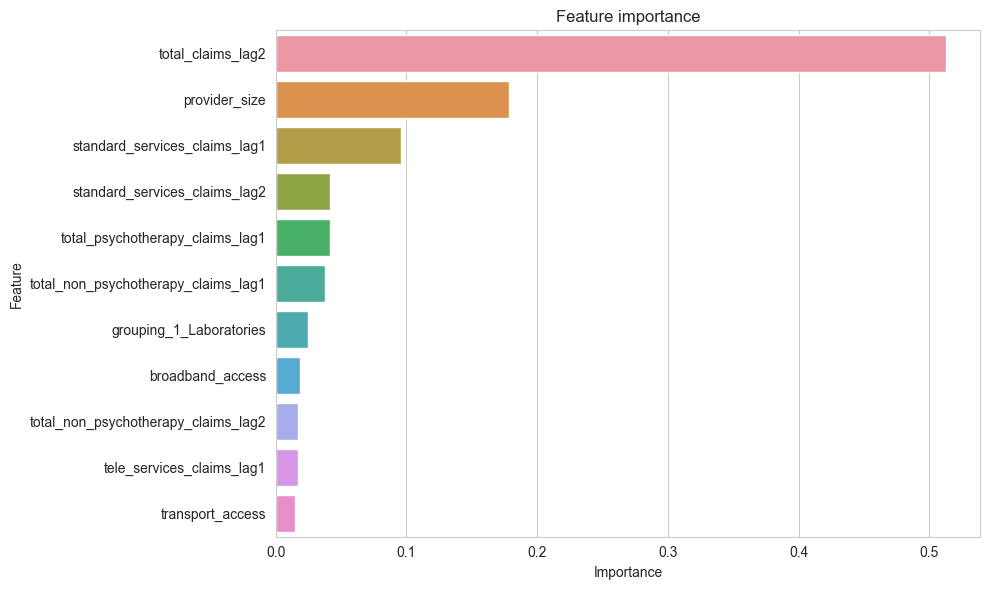

In [556]:
model1_without_lag1_important_features_importances = plot_feature_importances(model1_without_lag1_important_features, X_train_important_no_lag1.columns)

The effect of removing the first lag on the performance is small. Below, we try to remove the second lag as well to see how the importances will get redistributed and whether the performance worsens.

In [557]:
X_train2 = X_train1.drop('total_claims_lag2', axis=1)
X_test2 = X_test1.drop('total_claims_lag2', axis=1)
model1_without_lags = random_forest_optuna(X_train2, y_train, X_test2, y_test, 50)

[I 2024-06-21 18:12:37,343] A new study created in memory with name: no-name-b0e4a819-f9ec-4283-bdeb-e4cd1ab5d0e4
[I 2024-06-21 18:12:45,066] Trial 0 finished with value: 14115.732582075656 and parameters: {'n_estimators': 237, 'max_depth': 16, 'min_samples_split': 2, 'min_samples_leaf': 5, 'max_features': 0.2217551212230106, 'bootstrap': True}. Best is trial 0 with value: 14115.732582075656.
[I 2024-06-21 18:13:19,558] Trial 1 finished with value: 12519.297023599434 and parameters: {'n_estimators': 378, 'max_depth': 50, 'min_samples_split': 2, 'min_samples_leaf': 3, 'max_features': 0.4804258945338068, 'bootstrap': True}. Best is trial 1 with value: 12519.297023599434.
[I 2024-06-21 18:13:33,751] Trial 2 finished with value: 13506.047457790808 and parameters: {'n_estimators': 102, 'max_depth': 23, 'min_samples_split': 4, 'min_samples_leaf': 5, 'max_features': 0.8867667105866088, 'bootstrap': True}. Best is trial 1 with value: 12519.297023599434.
[I 2024-06-21 18:14:03,716] Trial 3 fini

Best params: {'n_estimators': 130, 'max_depth': 19, 'min_samples_split': 2, 'min_samples_leaf': 1, 'max_features': 0.9265760050108685, 'bootstrap': False}
R2 Score: 0.9054914431010641
Mean Absolute Error: 17.38137115336111
Mean Squared Error: 4955.79256225586
Root Mean Squared Error: 70.39739030856087


In [558]:
dump(model1_without_lags, 'model1_without_lags.joblib')

['model1_without_lags.joblib']

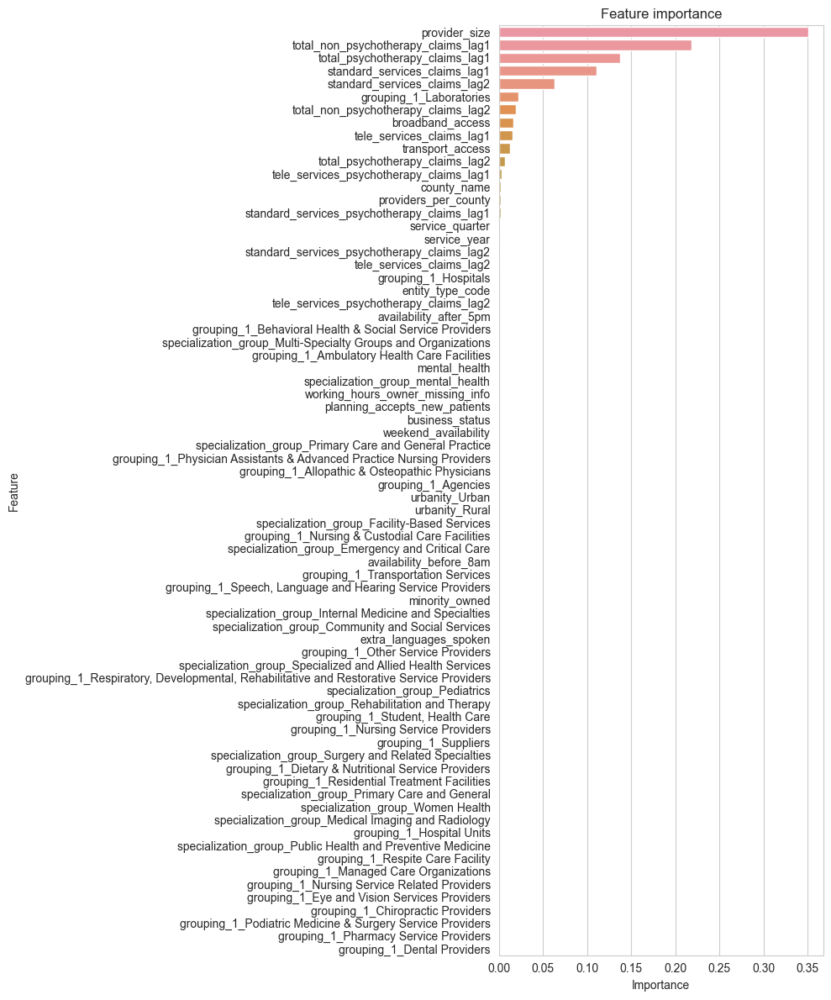

In [600]:
model1_without_lags_importances = plot_feature_importances(model1_without_lags, X_train2.columns)

In [620]:
feature_importance_dict = {feature: importance for feature, importance in zip(X_train2.columns, model1_without_lags_importances)}

important_columns = sorted([(feature, importance) for feature, importance in feature_importance_dict.items() if importance > 0.01], key=lambda x: x[1], reverse=True)

for feature, importance in important_columns:
    print(f'{bold}{feature}{reset}: {round(importance*100, 2)}%')

provider_size: 35.05%
total_non_psychotherapy_claims_lag1: 21.88%
total_psychotherapy_claims_lag1: 13.78%
standard_services_claims_lag1: 11.11%
standard_services_claims_lag2: 6.31%
grouping_1_Laboratories: 2.27%
total_non_psychotherapy_claims_lag2: 1.93%
broadband_access: 1.69%
tele_services_claims_lag1: 1.55%
transport_access: 1.29%


In [621]:
important_columns = [col[0] for col in important_columns]
X_train_important_without_lags = X_train[important_columns]
X_test_important_without_lags = X_test[important_columns]

In [615]:
model1_without_lags_important_features = random_forest_optuna(X_train_important_without_lags, y_train, X_test_important_without_lags, y_test, 20)
dump(model1_without_lags_important_features, 'model1_without_lags_important_features.joblib')

[I 2024-06-21 23:55:34,919] A new study created in memory with name: no-name-234c5707-e530-4f87-abf7-b2eb9a8885d2
[I 2024-06-21 23:55:50,273] Trial 0 finished with value: 14035.274608868587 and parameters: {'n_estimators': 335, 'max_depth': 46, 'min_samples_split': 5, 'min_samples_leaf': 4, 'max_features': 0.6084614756893989, 'bootstrap': False}. Best is trial 0 with value: 14035.274608868587.
[I 2024-06-21 23:55:58,196] Trial 1 finished with value: 15550.001582757304 and parameters: {'n_estimators': 124, 'max_depth': 33, 'min_samples_split': 3, 'min_samples_leaf': 4, 'max_features': 0.9265815009306346, 'bootstrap': False}. Best is trial 0 with value: 14035.274608868587.
[I 2024-06-21 23:56:35,218] Trial 2 finished with value: 9548.166498090379 and parameters: {'n_estimators': 493, 'max_depth': 50, 'min_samples_split': 2, 'min_samples_leaf': 1, 'max_features': 0.8732949064106074, 'bootstrap': False}. Best is trial 2 with value: 9548.166498090379.
[I 2024-06-21 23:56:43,333] Trial 3 fin

Best params: {'n_estimators': 493, 'max_depth': 50, 'min_samples_split': 2, 'min_samples_leaf': 1, 'max_features': 0.8732949064106074, 'bootstrap': False}
R2 Score: 0.9196773658454843
Mean Absolute Error: 18.14174416736741
Mean Squared Error: 4211.918221853934
Root Mean Squared Error: 64.89929292260382


['model1_without_lags_important_features.joblib']

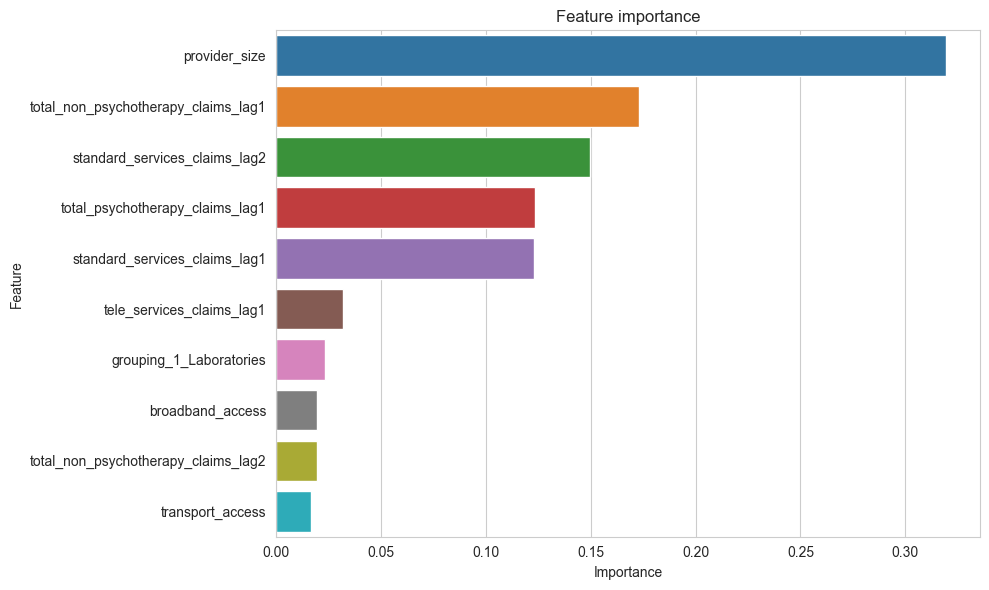

In [616]:
model1_without_lags_important_features_importances = plot_feature_importances(model1_without_lags_important_features, X_train_important_without_lags.columns)

Plotting True vs Predicted Total claims, and then Residuals for **the model with both total claim lags**: full range of True Total Claims and then for up to 500 to see how the model predicts smaller values.

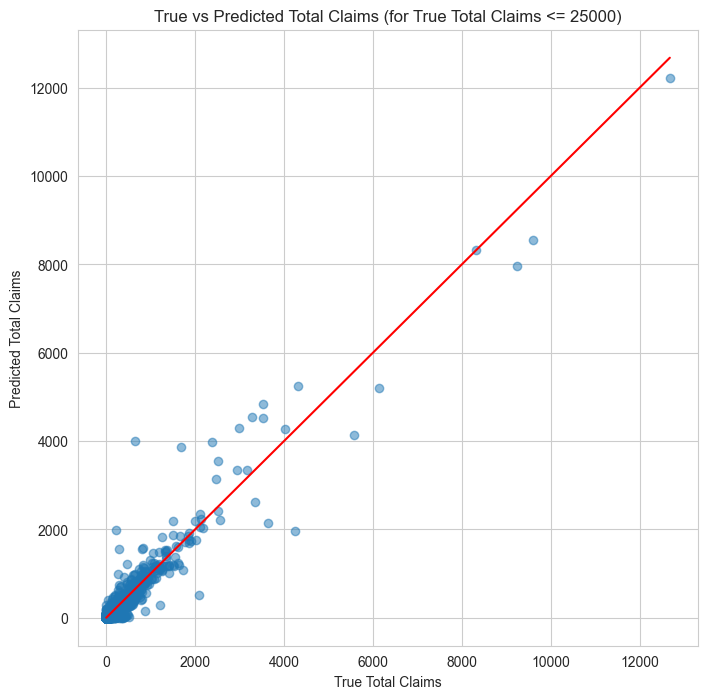

In [608]:
plot_true_pred_claims(model1_important_features, X_test_important_both_lags, y_test, 25000)

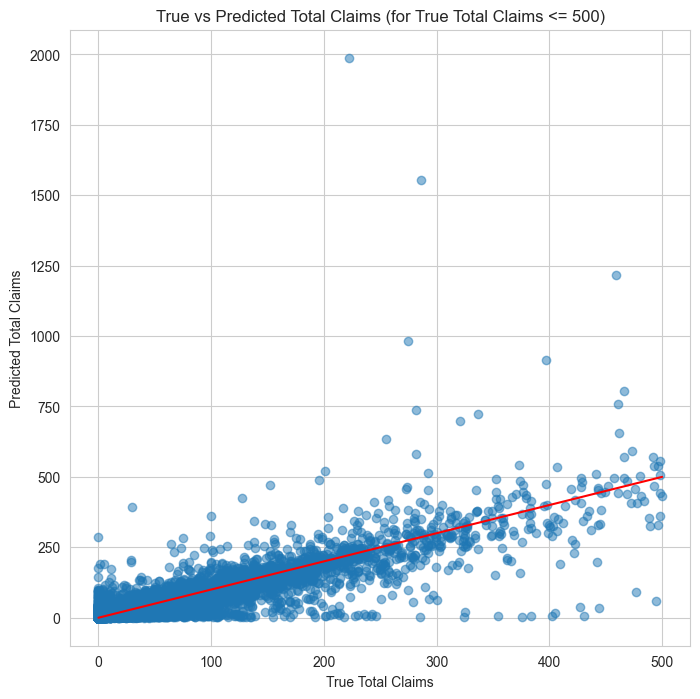

In [609]:
plot_true_pred_claims(model1_important_features, X_test_important_both_lags, y_test, 500)

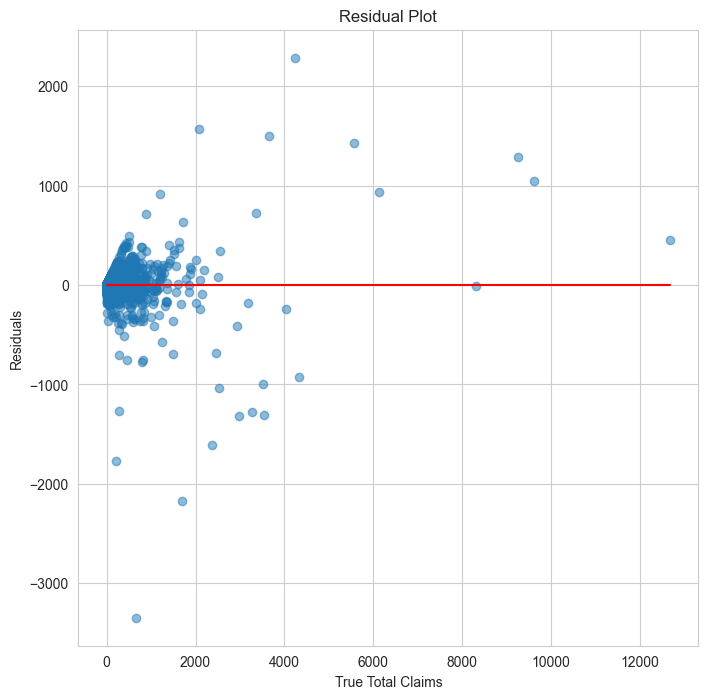

In [613]:
plot_residuals(model1_important_features, X_test_important_both_lags, y_test)

Plotting True vs Predicted Total claims, and then Residuals for **the model without total claim lags**: full range of True Total Claims and then for up to 500 to see how the model predicts smaller values.

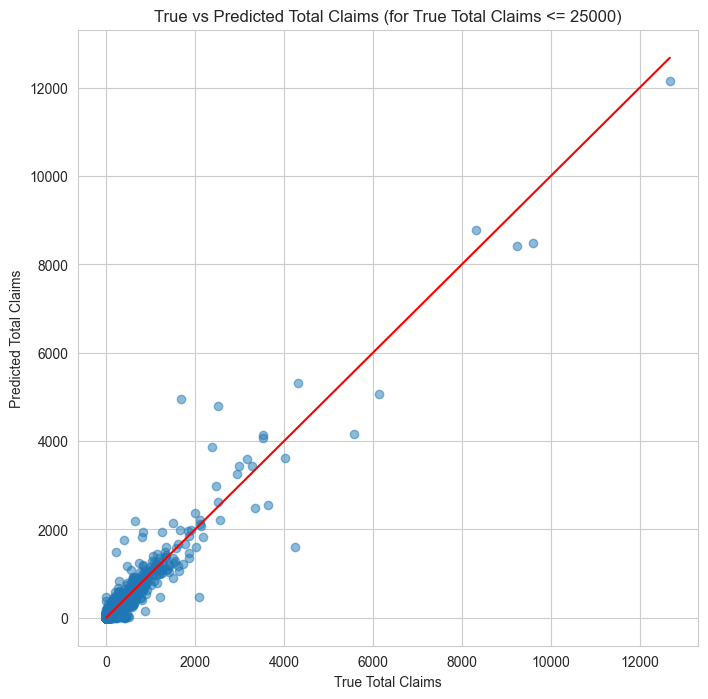

In [622]:
plot_true_pred_claims(model1_without_lags_important_features, X_test_important_without_lags, y_test, 25000)

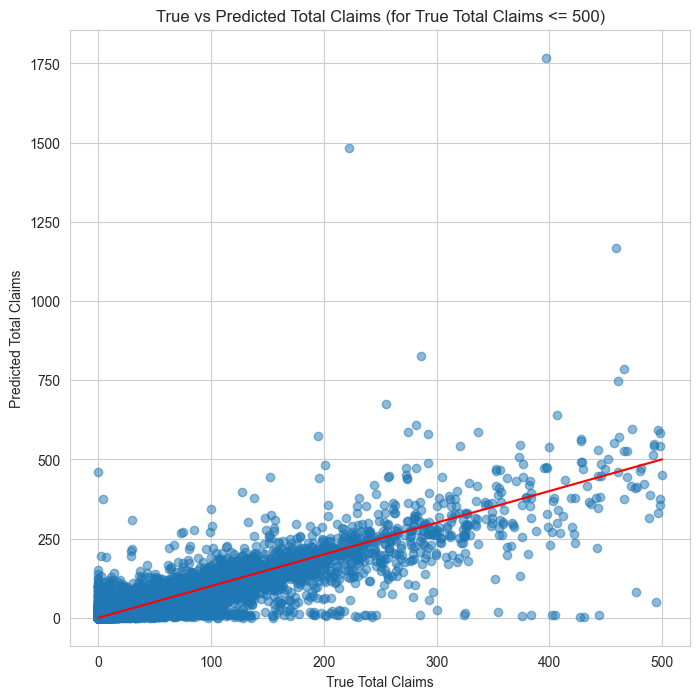

In [623]:
plot_true_pred_claims(model1_without_lags_important_features, X_test_important_without_lags, y_test, 500)

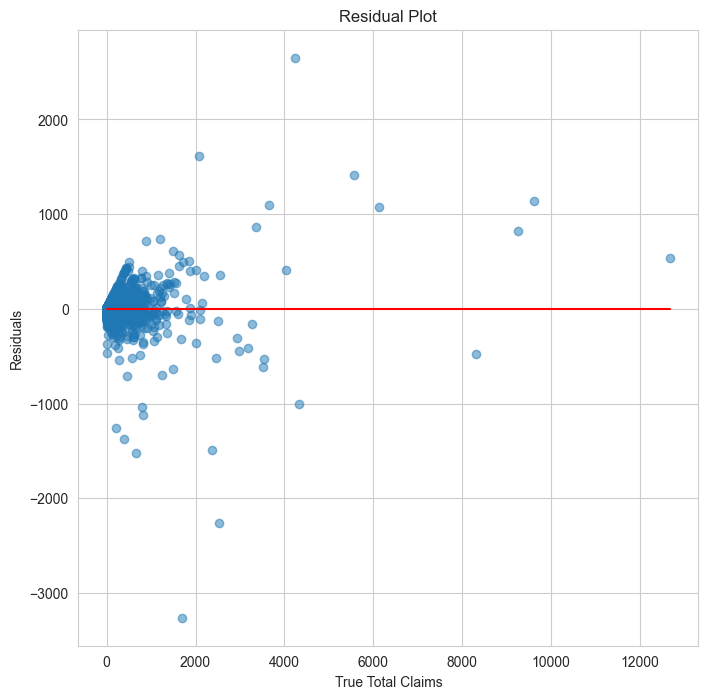

In [624]:
plot_residuals(model1_without_lags_important_features, X_test_important_without_lags, y_test)

**Conclusion**: with or without lags, the performance of the models and the distribution of predictions vs true values are similar. 

### XGBoost Model Trial (unsuccessful - no increase in performance)

In [510]:
from xgboost import XGBRegressor

def objectiveXGB(trial, X, y):
    n_estimators = trial.suggest_int("n_estimators", 100, 500)
    max_depth = trial.suggest_int("max_depth", 2, 25)
    learning_rate = trial.suggest_float("learning_rate", 0.01, 0.3)
    min_child_weight = trial.suggest_int("min_child_weight", 1, 10)
    subsample = trial.suggest_float("subsample", 0.1, 1.0)
    colsample_bytree = trial.suggest_float("colsample_bytree", 0.1, 1.0)
    reg_alpha = trial.suggest_float("reg_alpha", 1e-8, 1.0, log=True)
    reg_lambda = trial.suggest_float("reg_lambda", 1e-8, 1.0, log=True)

    xgb = XGBRegressor(
        n_estimators=n_estimators,
        max_depth=max_depth,
        learning_rate=learning_rate,
        min_child_weight=min_child_weight,
        subsample=subsample,
        colsample_bytree=colsample_bytree,
        reg_alpha=reg_alpha,
        reg_lambda=reg_lambda,
        objective='reg:squarederror'
    )

    score = cross_val_score(xgb, X, y, cv=5, scoring="neg_mean_squared_error")
    return -1 * score.mean()

def xgboost_optuna(X_train, y_train, X_test, y_test, n_trials):
    study = optuna.create_study(direction="minimize")
    study.optimize(lambda trial:objectiveXGB(trial, X_train, y_train), n_trials=n_trials)
    best_params = study.best_params

    model = XGBRegressor(**best_params, objective='reg:squarederror')
    model.fit(X_train, y_train)

    preds = model.predict(X_test)
    r2, mae, mse, rmse = regression_metrics(y_test, preds)

    print(f"Best params: {best_params}")
    print_regression_metrics(y_test, preds)

    return model

In [512]:
model2 = xgboost_optuna(X_train, y_train, X_test, y_test, 10)
dump(model2, 'model2.joblib')

[I 2024-06-20 14:42:10,395] A new study created in memory with name: no-name-5814d5db-b6f7-4b0c-a38b-788ee75f8c8a
[I 2024-06-20 14:42:41,434] Trial 0 finished with value: 10324.898430693469 and parameters: {'n_estimators': 154, 'max_depth': 14, 'learning_rate': 0.0325860501312656, 'min_child_weight': 4, 'subsample': 0.4575043407554939, 'colsample_bytree': 0.3186774625544735, 'reg_alpha': 8.853185902105221e-07, 'reg_lambda': 0.12222984772510193}. Best is trial 0 with value: 10324.898430693469.
[I 2024-06-20 14:48:07,036] Trial 1 finished with value: 9710.080288775174 and parameters: {'n_estimators': 496, 'max_depth': 21, 'learning_rate': 0.01659261925944722, 'min_child_weight': 8, 'subsample': 0.5637373363332954, 'colsample_bytree': 0.8184332566159401, 'reg_alpha': 3.50597354971247e-05, 'reg_lambda': 1.8298443263473746e-08}. Best is trial 1 with value: 9710.080288775174.
[I 2024-06-20 14:48:51,028] Trial 2 finished with value: 13370.375252679916 and parameters: {'n_estimators': 195, 'ma

Best params: {'n_estimators': 148, 'max_depth': 24, 'learning_rate': 0.1110041950305624, 'min_child_weight': 3, 'subsample': 0.5105023177986374, 'colsample_bytree': 0.8914644588101912, 'reg_alpha': 2.5822117015346416e-07, 'reg_lambda': 1.2292230821447034e-08}
R2 Score: 0.8862751717337268
Mean Absolute Error: 17.745420735201243
Mean Squared Error: 5963.445814419877
Root Mean Squared Error: 77.22335018904501


['model1.joblib']

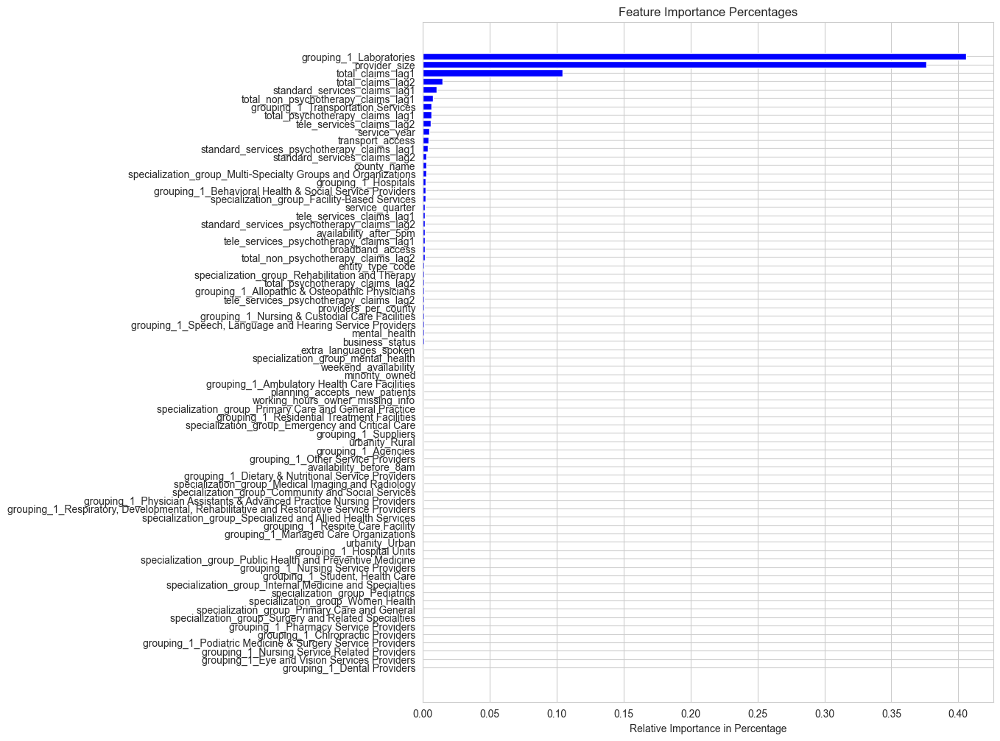

In [516]:
import matplotlib.pyplot as plt

features = X_train.columns  # replace it to your actual features
importances = model2.feature_importances_

importances_percentage = importances / importances.sum()

indices = np.argsort(importances_percentage)
plt.figure(figsize=(10, 12)) # increase the second value here for a taller figure

plt.title('Feature Importance Percentages')
plt.barh(range(len(indices)), importances_percentage[indices], color='b', align='center')
plt.yticks(range(len(indices)), [features[i] for i in indices])
plt.xlabel('Relative Importance in Percentage')
plt.show()

In [518]:
feature_importance_dict = {feature: importance for feature, importance in zip(X_train.columns, model2.feature_importances_)}

important_columns = sorted([(feature, importance) for feature, importance in feature_importance_dict.items() if importance > 0.005], key=lambda x: x[1], reverse=True)

for feature, importance in important_columns:
    print(f'{bold}{feature}{reset}: {round(importance*100, 2)}%')

grouping_1_Laboratories: 40.59%
provider_size: 37.6%
total_claims_lag1: 10.46%
total_claims_lag2: 1.46%
standard_services_claims_lag1: 1.03%
total_non_psychotherapy_claims_lag1: 0.76%
grouping_1_Transportation Services: 0.67%
total_psychotherapy_claims_lag1: 0.66%
tele_services_claims_lag2: 0.62%
service_year: 0.51%


In [519]:
important_columns = [col[0] for col in important_columns]
X_train_important = X_train[important_columns]
X_test_important = X_test[important_columns]

model2_more_important_features = random_forest_optuna(X_train_important, y_train, X_test_important, y_test, 20)

[I 2024-06-20 15:04:21,044] A new study created in memory with name: no-name-2a7272d0-6513-481c-880e-b328ed21ec51
[I 2024-06-20 15:04:30,629] Trial 0 finished with value: 10927.467568402466 and parameters: {'n_estimators': 342, 'max_depth': 28, 'min_samples_split': 4, 'min_samples_leaf': 5, 'max_features': 0.509530315693736, 'bootstrap': False}. Best is trial 0 with value: 10927.467568402466.
[I 2024-06-20 15:04:44,675] Trial 1 finished with value: 9737.26287537179 and parameters: {'n_estimators': 422, 'max_depth': 24, 'min_samples_split': 3, 'min_samples_leaf': 1, 'max_features': 0.9807212544342478, 'bootstrap': True}. Best is trial 1 with value: 9737.26287537179.
[I 2024-06-20 15:04:49,363] Trial 2 finished with value: 10412.113536827115 and parameters: {'n_estimators': 273, 'max_depth': 21, 'min_samples_split': 3, 'min_samples_leaf': 2, 'max_features': 0.37026859400853157, 'bootstrap': False}. Best is trial 1 with value: 9737.26287537179.
[I 2024-06-20 15:04:56,786] Trial 3 finished

Best params: {'n_estimators': 204, 'max_depth': 41, 'min_samples_split': 3, 'min_samples_leaf': 1, 'max_features': 0.9793816938783361, 'bootstrap': True}
R2 Score: 0.8646125927877752
Mean Absolute Error: 17.66130812909988
Mean Squared Error: 7099.377323081354
Root Mean Squared Error: 84.25780274301813


Integrating a **hybrid loss function** into XGBoost models

In [189]:
import xgboost as xgb
import numpy as np
import optuna
from sklearn.metrics import r2_score, mean_absolute_error, mean_squared_error

def hybrid_loss(y_true, y_pred):
    threshold = 200  # Setthing the threshold
    mse = (y_true - y_pred) ** 2
    mae = np.abs(y_true - y_pred)
    return np.mean(np.where(y_true <= threshold, mse, mae))

def objective_hybrid(trial, X, y):
    n_estimators = trial.suggest_int("n_estimators", 200, 500)
    max_depth = trial.suggest_int("max_depth", 2, 10)
    learning_rate = trial.suggest_float("learning_rate", 0.01, 0.1)
    min_child_weight = trial.suggest_int("min_child_weight", 1, 10)
    subsample = trial.suggest_float("subsample", 0.5, 1.0)
    gamma = trial.suggest_float("gamma", 0, 0.5)
    colsample_bytree = trial.suggest_float("colsample_bytree", 0.5, 1.0)

    params = {
        'objective': 'reg:squarederror',
        'n_estimators': n_estimators,
        'max_depth': max_depth,
        'learning_rate': learning_rate,
        'min_child_weight': min_child_weight,
        'subsample': subsample,
        'gamma': gamma,
        'colsample_bytree': colsample_bytree
    }

    gbm = xgb.XGBRegressor(**params)
    gbm.fit(X, y)
    preds = gbm.predict(X)

    return hybrid_loss(y, preds)

def xgboost_optuna(X_train, y_train, X_test, y_test, n_trials=100):
    study = optuna.create_study()
    study.optimize(lambda trial: objective_hybrid(trial, X_train, y_train), n_trials=n_trials)

    best_params = study.best_params
    best_params["objective"] = 'reg:squarederror'
    print(f"Best params: {best_params}")

    model = xgb.XGBRegressor(**best_params)
    model.fit(X_train, y_train)

    preds = model.predict(X_test)

    r2 = r2_score(y_test, preds)
    mae = mean_absolute_error(y_test, preds)
    mse = mean_squared_error(y_test, preds)
    rmse = math.sqrt(mse)

    print(f"Final r2 score: {r2}")
    print(f"Final MAE score: {mae}")
    print(f"Final MSE score: {mse}")
    print(f"Final RMSE score: {rmse}")

    return model

In [156]:
model3_1 = xgboost_optuna(X_train, y_train, X_test, y_test, 20)
dump(model3_1, 'model3_1.joblib')

[I 2024-06-23 23:24:11,288] A new study created in memory with name: no-name-6930bbae-fcf6-40a5-8c91-341e4e39ec20
[I 2024-06-23 23:24:20,840] Trial 0 finished with value: 446.30257876442266 and parameters: {'n_estimators': 243, 'max_depth': 10, 'learning_rate': 0.04716639858833831, 'min_child_weight': 8, 'subsample': 0.5968233651496024, 'gamma': 0.13687932159797245, 'colsample_bytree': 0.9914999576273384}. Best is trial 0 with value: 446.30257876442266.
[I 2024-06-23 23:24:28,372] Trial 1 finished with value: 422.69696941566895 and parameters: {'n_estimators': 373, 'max_depth': 8, 'learning_rate': 0.012557654219408331, 'min_child_weight': 7, 'subsample': 0.7732567018583922, 'gamma': 0.11153985115184195, 'colsample_bytree': 0.741340407063132}. Best is trial 1 with value: 422.69696941566895.
[I 2024-06-23 23:24:37,898] Trial 2 finished with value: 289.4093249959687 and parameters: {'n_estimators': 459, 'max_depth': 9, 'learning_rate': 0.0743863110213295, 'min_child_weight': 3, 'subsample

Best params: {'n_estimators': 498, 'max_depth': 10, 'learning_rate': 0.08019947976255029, 'min_child_weight': 1, 'subsample': 0.9202954251671778, 'gamma': 0.019975926808772748, 'colsample_bytree': 0.5306291919800108, 'objective': 'reg:squarederror'}
Final r2 score: 0.9213631913760189
Final MAE score: 16.309770330555292
Final MSE score: 4123.51774363673
Final RMSE score: 64.2146225063788


['model3_1.joblib']

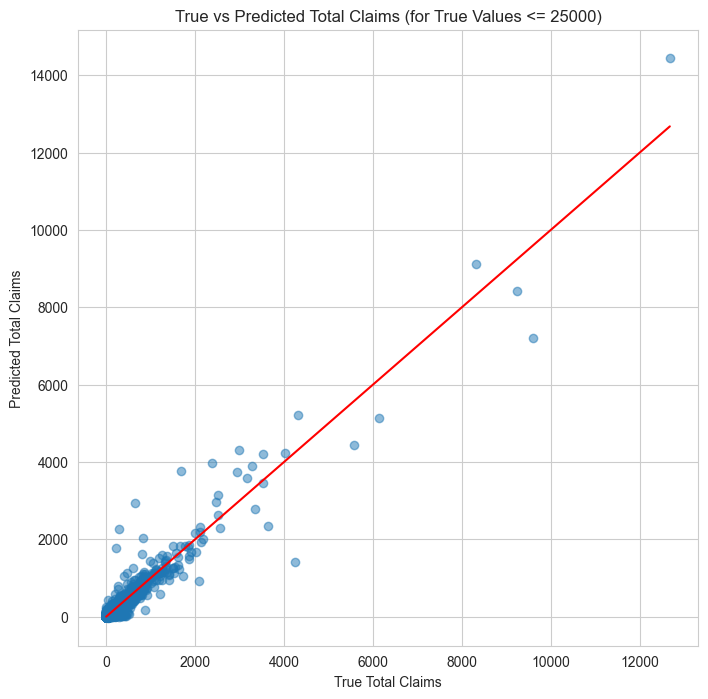

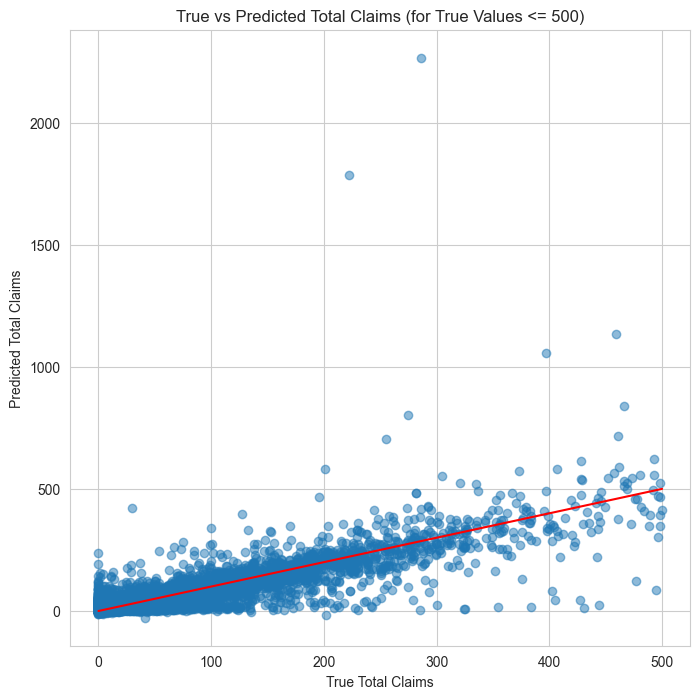

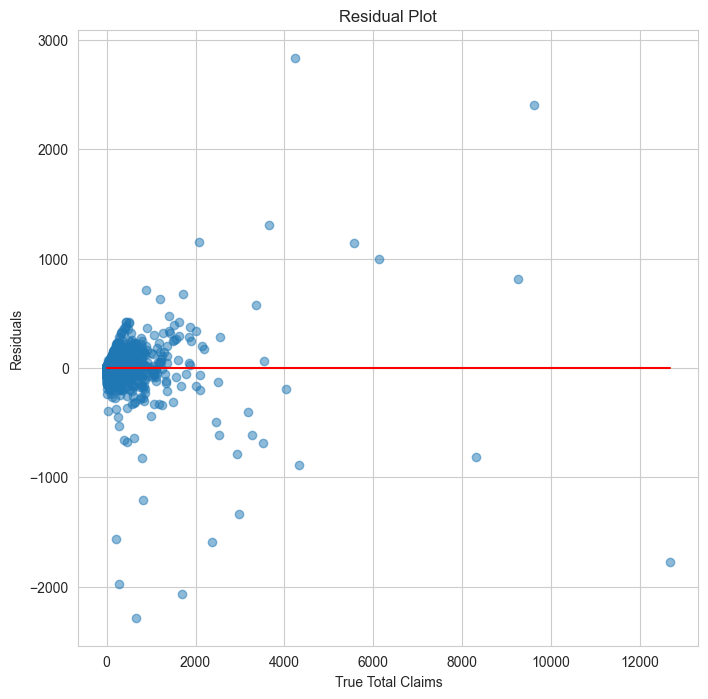

In [157]:
plot_true_pred_claims(model3_1, X_test, y_test, 25000)
plot_true_pred_claims(model3_1, X_test, y_test, 500)
plot_residuals(model3_1, X_test, y_test)

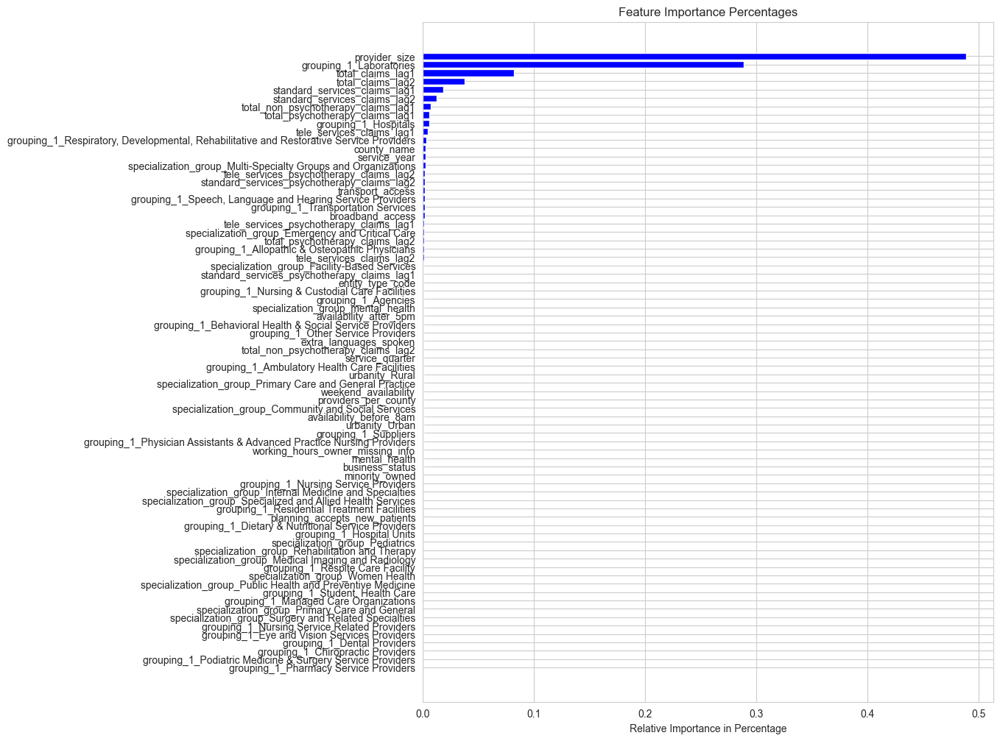

In [158]:
import matplotlib.pyplot as plt

features = X_train.columns  # replace it to your actual features
importances = model3_1.feature_importances_

importances_percentage = importances / importances.sum()

indices = np.argsort(importances_percentage)
plt.figure(figsize=(10, 12)) # increase the second value here for a taller figure

plt.title('Feature Importance Percentages')
plt.barh(range(len(indices)), importances_percentage[indices], color='b', align='center')
plt.yticks(range(len(indices)), [features[i] for i in indices])
plt.xlabel('Relative Importance in Percentage')
plt.show()

In [160]:
feature_importance_dict = {feature: importance for feature, importance in zip(X_train.columns, model3_1.feature_importances_)}

important_columns = sorted([(feature, importance) for feature, importance in feature_importance_dict.items() if importance > 0.005], key=lambda x: x[1], reverse=True)

for feature, importance in important_columns:
    print(f'{bold}{feature}{reset}: {round(importance*100, 2)}%')

provider_size: 48.9%
grouping_1_Laboratories: 28.89%
total_claims_lag1: 8.21%
total_claims_lag2: 3.78%
standard_services_claims_lag1: 1.83%
standard_services_claims_lag2: 1.23%
total_non_psychotherapy_claims_lag1: 0.72%
total_psychotherapy_claims_lag1: 0.63%
grouping_1_Hospitals: 0.57%


Using the important features from the Random Forest model, used for initial importance-based feature selection

In [195]:
important_variables = [
    "total_claims_lag1",
    "total_claims_lag2",
    "provider_size",
    "total_non_psychotherapy_claims_lag1",
    "total_psychotherapy_claims_lag1",
    "standard_services_claims_lag1",
    "standard_services_claims_lag2",
    "grouping_1_Laboratories",
    "total_non_psychotherapy_claims_lag2",
    "broadband_access",
    "county_name",
    "transport_access"
]
X_train_important = X_train[important_variables]
X_test_important = X_test[important_variables]

model3_1_imp_f_with_lags1 = xgboost_optuna(X_train_important, y_train, X_test_important, y_test, 20)
dump(model3_1_imp_f_with_lags1, 'model3_1_imp_f_with_lags1.joblib')

[I 2024-06-24 00:58:42,155] A new study created in memory with name: no-name-7ab2805e-3039-4bb2-808f-14317ff434b4
[I 2024-06-24 00:58:49,942] Trial 0 finished with value: 477.8272032172843 and parameters: {'n_estimators': 349, 'max_depth': 6, 'learning_rate': 0.013746271660913745, 'min_child_weight': 5, 'subsample': 0.6588351540889881, 'gamma': 0.4362357996299026, 'colsample_bytree': 0.7182185399072065}. Best is trial 0 with value: 477.8272032172843.
[I 2024-06-24 00:58:52,187] Trial 1 finished with value: 609.3601057698796 and parameters: {'n_estimators': 208, 'max_depth': 5, 'learning_rate': 0.0645031793989678, 'min_child_weight': 10, 'subsample': 0.6740371306588291, 'gamma': 0.2974453836334173, 'colsample_bytree': 0.7755301854855448}. Best is trial 0 with value: 477.8272032172843.
[I 2024-06-24 00:58:57,231] Trial 2 finished with value: 390.4382009384069 and parameters: {'n_estimators': 498, 'max_depth': 6, 'learning_rate': 0.06706558151953478, 'min_child_weight': 4, 'subsample': 0.

Best params: {'n_estimators': 300, 'max_depth': 9, 'learning_rate': 0.09871188719098356, 'min_child_weight': 3, 'subsample': 0.9664620790939167, 'gamma': 0.4814929153328628, 'colsample_bytree': 0.9188125357425845, 'objective': 'reg:squarederror'}
Final r2 score: 0.9172636559828128
Final MAE score: 17.173868839194725
Final MSE score: 4338.487135583757
Final RMSE score: 65.86719316612601


['model3_1_imp_f_with_lags1.joblib']

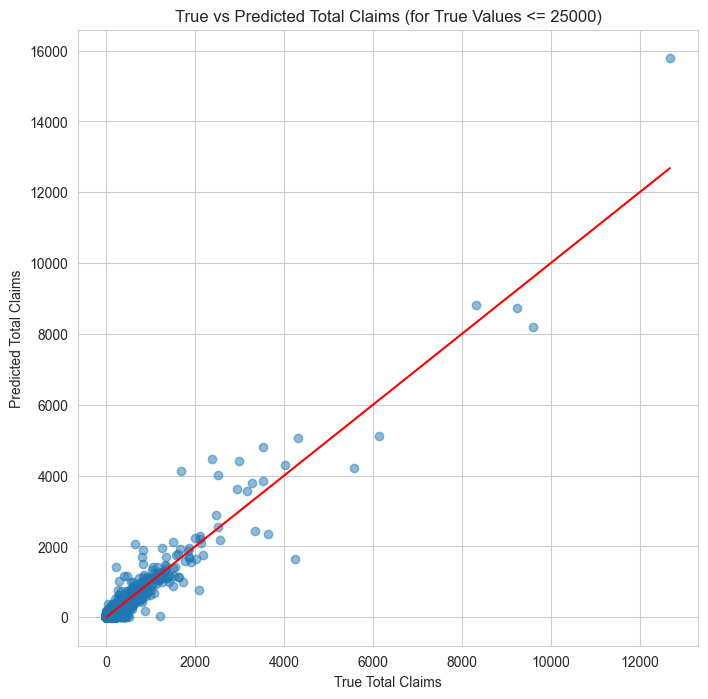

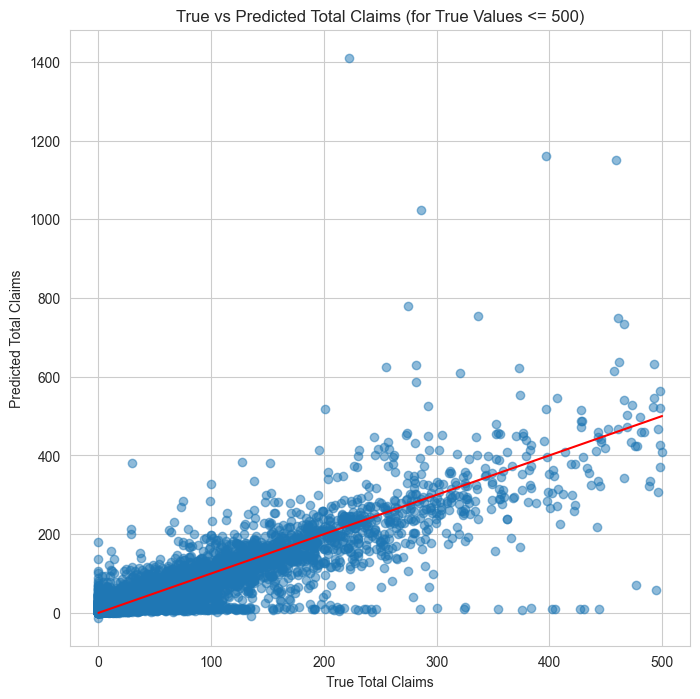

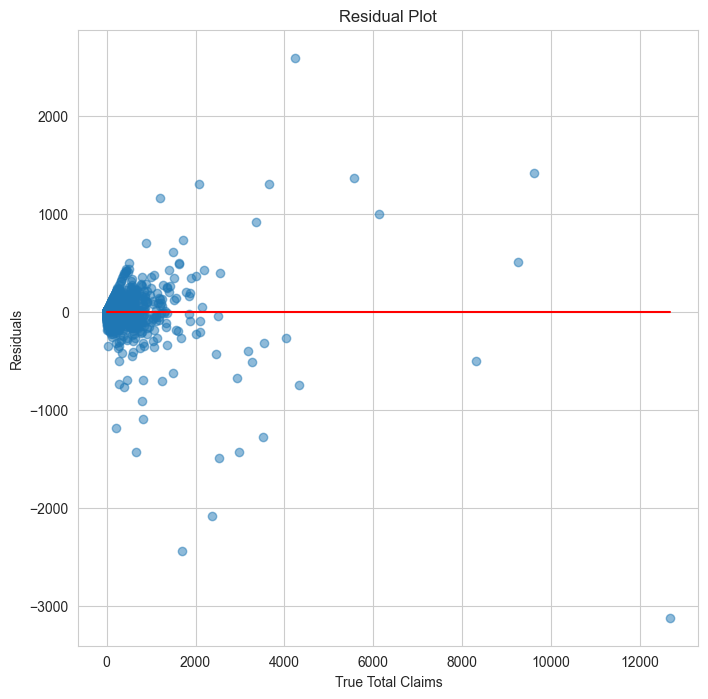

In [191]:
plot_true_pred_claims(model3_1_imp_f, X_test_important, y_test, 25000)
plot_true_pred_claims(model3_1_imp_f, X_test_important, y_test, 500)
plot_residuals(model3_1_imp_f, X_test_important, y_test)

Applying **Log Transformation** to the target

In [175]:
from sklearn.metrics import mean_squared_log_error

def hybrid_loss(y_true, y_pred):
    threshold = 200  # Set your own threshold
    mse = (y_true - y_pred) ** 2
    mae = np.abs(y_true - y_pred)
    return np.mean(np.where(y_true <= threshold, mse, mae))

def objective_hybrid(trial, X, y):
    n_estimators = trial.suggest_int("n_estimators", 200, 500)
    max_depth = trial.suggest_int("max_depth", 2, 10)
    learning_rate = trial.suggest_float("learning_rate", 0.01, 0.1)
    min_child_weight = trial.suggest_int("min_child_weight", 1, 10)
    subsample = trial.suggest_float("subsample", 0.5, 1.0)
    gamma = trial.suggest_float("gamma", 0, 0.5)
    colsample_bytree = trial.suggest_float("colsample_bytree", 0.5, 1.0)

    params = {
        'objective': 'reg:squarederror',
        'n_estimators': n_estimators,
        'max_depth': max_depth,
        'learning_rate': learning_rate,
        'min_child_weight': min_child_weight,
        'subsample': subsample,
        'gamma': gamma,
        'colsample_bytree': colsample_bytree
    }

    gbm = xgb.XGBRegressor(**params)
    gbm.fit(X, np.log1p(y))  # Apply log transformation to y
    preds = np.expm1(gbm.predict(X))
    preds = np.clip(preds, 0, None)  # ensure no negative predictions
    return mean_squared_log_error(y, preds)

def xgboost_optuna_log(X_train, y_train, X_test, y_test, n_trials=100):
    study = optuna.create_study()
    study.optimize(lambda trial: objective_hybrid(trial, X_train, y_train), n_trials=n_trials)

    best_params = study.best_params
    best_params["objective"] = 'reg:squarederror'
    print(f"Best params: {best_params}")

    model = xgb.XGBRegressor(**best_params)
    model.fit(X_train, y_train)

    preds = model.predict(X_test)

    r2 = r2_score(y_test, preds)
    mae = mean_absolute_error(y_test, preds)
    mse = mean_squared_error(y_test, preds)
    rmse = math.sqrt(mse)

    print(f"Final r2 score: {r2}")
    print(f"Final MAE score: {mae}")
    print(f"Final MSE score: {mse}")
    print(f"Final RMSE score: {rmse}")

    return model

In [176]:
log_model = xgboost_optuna_log(X_train, y_train, X_test, y_test, 20)
dump(log_model, 'log_model.joblib')

[I 2024-06-23 23:47:52,715] A new study created in memory with name: no-name-8cfe0fd2-6e38-4d0e-9c9a-6eee65908ec8
[I 2024-06-23 23:48:07,108] Trial 0 finished with value: 0.6779873460876097 and parameters: {'n_estimators': 419, 'max_depth': 7, 'learning_rate': 0.05109602285545249, 'min_child_weight': 8, 'subsample': 0.5503167786318135, 'gamma': 0.014240980379318813, 'colsample_bytree': 0.9407912905323199}. Best is trial 0 with value: 0.6779873460876097.
[I 2024-06-23 23:48:12,890] Trial 1 finished with value: 0.7396061187839086 and parameters: {'n_estimators': 467, 'max_depth': 5, 'learning_rate': 0.07981814925009911, 'min_child_weight': 8, 'subsample': 0.7504201562428454, 'gamma': 0.3381437411935252, 'colsample_bytree': 0.5834816773096569}. Best is trial 0 with value: 0.6779873460876097.
[I 2024-06-23 23:48:19,409] Trial 2 finished with value: 0.7200770638093235 and parameters: {'n_estimators': 394, 'max_depth': 6, 'learning_rate': 0.06206250263278571, 'min_child_weight': 9, 'subsampl

Best params: {'n_estimators': 489, 'max_depth': 10, 'learning_rate': 0.09756655739706566, 'min_child_weight': 5, 'subsample': 0.6434910350308861, 'gamma': 0.18133746507024573, 'colsample_bytree': 0.9995329674621983, 'objective': 'reg:squarederror'}
Final r2 score: 0.8966581564121527
Final MAE score: 16.57607348780331
Final MSE score: 5418.988043274508
Final RMSE score: 73.61377617861012


['log_model.joblib']

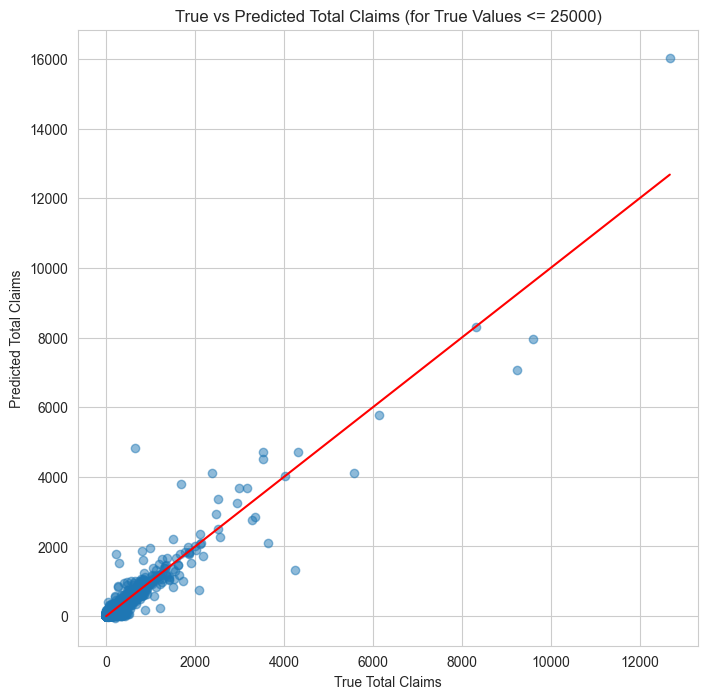

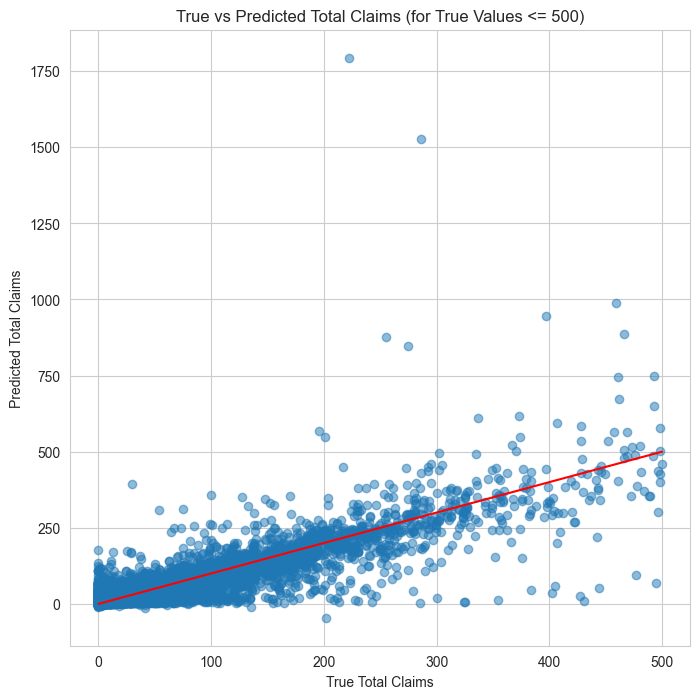

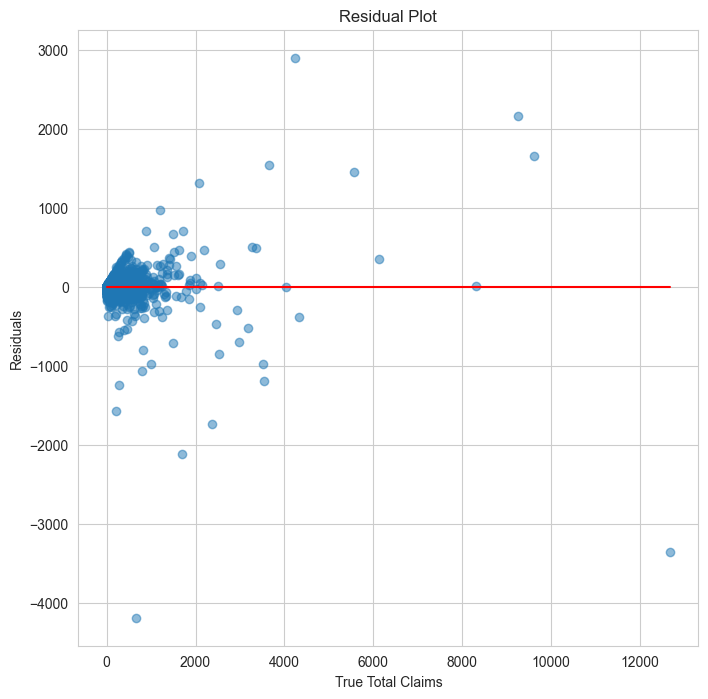

In [177]:
plot_true_pred_claims(log_model, X_test, y_test, 25000)
plot_true_pred_claims(log_model, X_test, y_test, 500)
plot_residuals(log_model, X_test, y_test)

Applying **Box-cox Transformation** to the target

In [186]:
from scipy.stats import boxcox
from scipy.special import inv_boxcox

def objective_hybrid_box(trial, X, y):
    n_estimators = trial.suggest_int("n_estimators", 200, 500)
    max_depth = trial.suggest_int("max_depth", 2, 10)
    learning_rate = trial.suggest_float("learning_rate", 0.01, 0.1)
    min_child_weight = trial.suggest_int("min_child_weight", 1, 10)
    subsample = trial.suggest_float("subsample", 0.5, 1.0)
    gamma = trial.suggest_float("gamma", 0, 0.5)
    colsample_bytree = trial.suggest_float("colsample_bytree", 0.5, 1.0)

    params = {
        'objective': 'reg:squarederror',
        'n_estimators': n_estimators,
        'max_depth': max_depth,
        'learning_rate': learning_rate,
        'min_child_weight': min_child_weight,
        'subsample': subsample,
        'gamma': gamma,
        'colsample_bytree': colsample_bytree
    }

    gbm = xgb.XGBRegressor(**params)

    # Calculate the optimal lambda on log1p transformed target
    y_transformed, lambda_ = boxcox(np.log1p(y + 1))
    # Fit model on transformed target
    gbm.fit(X, y_transformed)

    # Predict with model, note that outputs will be on the transformed space
    preds_transformed = gbm.predict(X)

    # Use inverse Box-Cox transformation to bring predictions back to original target space
    preds = np.expm1(inv_boxcox(preds_transformed, lambda_))
    return mean_squared_log_error(y, preds)

def xgboost_optuna_box(X_train, y_train, X_test, y_test, n_trials=100):
    study = optuna.create_study()
    study.optimize(lambda trial: objective_hybrid_box(trial, X_train, y_train), n_trials=n_trials)

    best_params = study.best_params
    best_params["objective"] = 'reg:squarederror'
    print(f"Best params: {best_params}")

    model = xgb.XGBRegressor(**best_params)
    model.fit(X_train, y_train)

    preds = model.predict(X_test)

    r2 = r2_score(y_test, preds)
    mae = mean_absolute_error(y_test, preds)
    mse = mean_squared_error(y_test, preds)
    rmse = math.sqrt(mse)

    print(f"Final r2 score: {r2}")
    print(f"Final MAE score: {mae}")
    print(f"Final MSE score: {mse}")
    print(f"Final RMSE score: {rmse}")

    return model

In [187]:
boxcox_model = xgboost_optuna_box(X_train, y_train, X_test, y_test, 20)
dump(boxcox_model, 'boxcox_model.joblib')

[I 2024-06-24 00:04:44,487] A new study created in memory with name: no-name-d493192a-bdb1-47d3-b83f-f87ffd39c569
[I 2024-06-24 00:04:53,045] Trial 0 finished with value: 0.8405889491874501 and parameters: {'n_estimators': 419, 'max_depth': 5, 'learning_rate': 0.02977061259896271, 'min_child_weight': 5, 'subsample': 0.7599435305295136, 'gamma': 0.31937544969601994, 'colsample_bytree': 0.569653856978465}. Best is trial 0 with value: 0.8405889491874501.
[I 2024-06-24 00:04:59,375] Trial 1 finished with value: 0.8434408543200196 and parameters: {'n_estimators': 282, 'max_depth': 5, 'learning_rate': 0.03651598906691249, 'min_child_weight': 4, 'subsample': 0.8825178337746562, 'gamma': 0.46784797367376224, 'colsample_bytree': 0.808947108183666}. Best is trial 0 with value: 0.8405889491874501.
[I 2024-06-24 00:05:16,114] Trial 2 finished with value: 0.6574362196379985 and parameters: {'n_estimators': 479, 'max_depth': 9, 'learning_rate': 0.03259570724923893, 'min_child_weight': 7, 'subsample'

Best params: {'n_estimators': 444, 'max_depth': 10, 'learning_rate': 0.07129567879285743, 'min_child_weight': 1, 'subsample': 0.8236365598319316, 'gamma': 0.10020767733144126, 'colsample_bytree': 0.7967488150764848, 'objective': 'reg:squarederror'}
Final r2 score: 0.91296208129751
Final MAE score: 16.269175476241607
Final MSE score: 4564.0509631449795
Final RMSE score: 67.55776019929154


['boxcox_model.joblib']

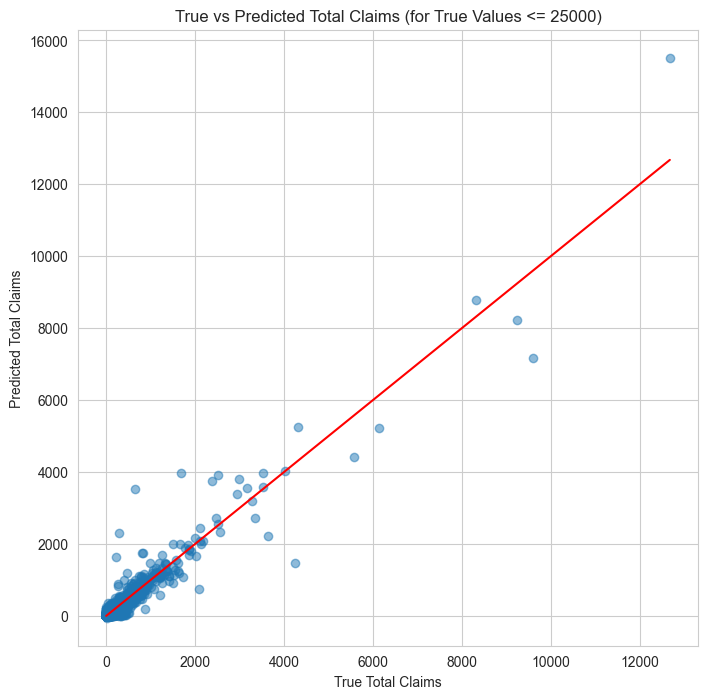

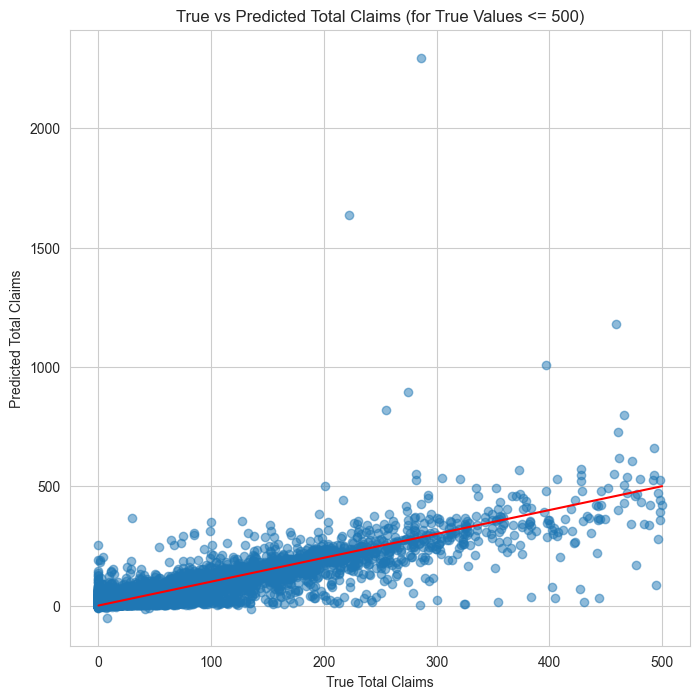

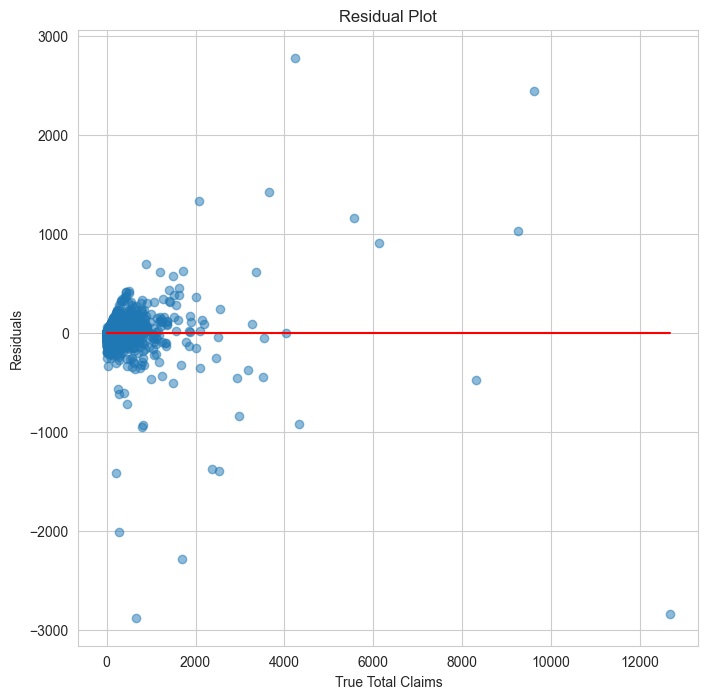

In [146]:
plot_true_pred_claims(boxcox_model, X_test, y_test, 25000)
plot_true_pred_claims(boxcox_model, X_test, y_test, 500)
plot_residuals(boxcox_model, X_test, y_test)